In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import cufflinks as cf
import plotly.express as px
cf.go_offline()
pd.set_option('display.max_columns', 500)

In [2]:
import os
os.listdir()

['.DS_Store',
 'Ejercicio Adicional.pdf',
 'train.csv',
 '.ipynb_checkpoints',
 'Ejercicio_Extra.ipynb']

In [3]:
#Revisamos los datos
df = pd.read_csv("train.csv",encoding="utf-8")
df.head(5)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


In [4]:
#Eliminamos la primer columna
df=df[df.columns[1:]].copy()
df.head(5)

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


In [5]:
df.shape

(103904, 24)

In [6]:
#Queremos que la unidad muestral sea por cliente, checamos que sean unicos
len(df["id"].unique())

103904

In [7]:
#Checamos si hay datos nulos
df.isnull().any()

id                                   False
Gender                               False
Customer Type                        False
Age                                  False
Type of Travel                       False
Class                                False
Flight Distance                      False
Inflight wifi service                False
Departure/Arrival time convenient    False
Ease of Online booking               False
Gate location                        False
Food and drink                       False
Online boarding                      False
Seat comfort                         False
Inflight entertainment               False
On-board service                     False
Leg room service                     False
Baggage handling                     False
Checkin service                      False
Inflight service                     False
Cleanliness                          False
Departure Delay in Minutes           False
Arrival Delay in Minutes              True
satisfactio

<AxesSubplot:>

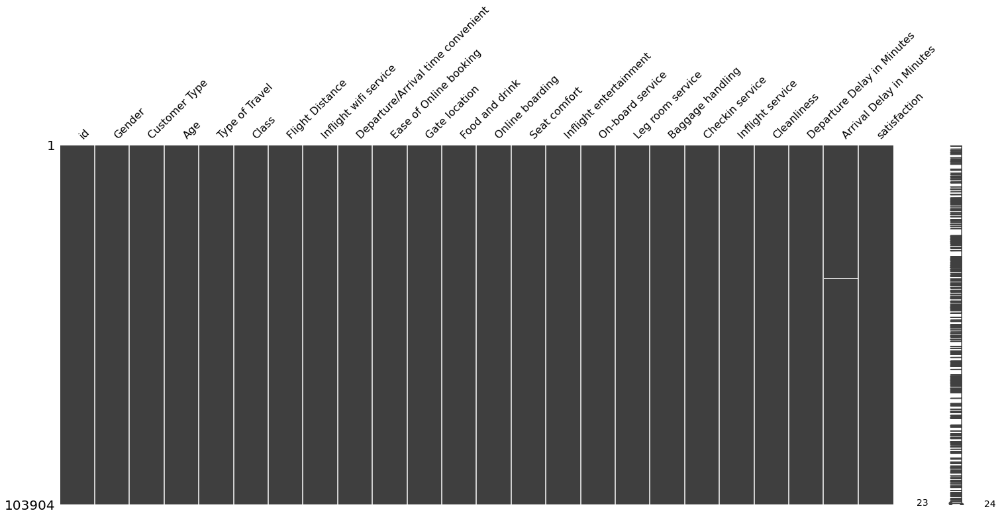

In [8]:
msno.matrix(df)

In [9]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table = pd.DataFrame(mz_table)
        return mz_table
table=missing_zero_values_table(df)
table

,Zero Values,Missing Values,% of Total Values,Total Zero Missing Values
id,0,0,0.000000,0
Gender,0,0,0.000000,0
Customer Type,0,0,0.000000,0
Age,0,0,0.000000,0
Type of Travel,0,0,0.000000,0
Class,0,0,0.000000,0
Flight Distance,0,0,0.000000,0
Inflight wifi service,3103,0,0.000000,3103
Departure/Arrival time convenient,5300,0,0.000000,5300
Ease of Online booking,4487,0,0.000000,4487


In [10]:
df.loc[df["Arrival Delay in Minutes"].isnull()]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
213,49608,Female,Loyal Customer,38,Business travel,Eco,109,5,3,3,3,5,5,5,5,5,2,4,1,1,5,31,NaN,satisfied
1124,73442,Male,Loyal Customer,53,Personal Travel,Eco,1012,3,2,3,4,4,3,4,4,4,4,4,3,3,4,38,NaN,neutral or dissatisfied
1529,71178,Male,Loyal Customer,39,Business travel,Business,733,2,5,5,5,2,4,3,2,2,2,2,2,2,3,11,NaN,neutral or dissatisfied
2004,72940,Female,disloyal Customer,26,Business travel,Business,1035,3,3,3,1,2,3,2,2,3,3,4,5,5,2,41,NaN,neutral or dissatisfied
2108,116374,Female,Loyal Customer,24,Personal Travel,Eco,417,2,1,2,2,5,2,5,5,1,4,2,1,2,5,1,NaN,neutral or dissatisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102067,36729,Male,Loyal Customer,49,Personal Travel,Eco Plus,1249,2,5,2,3,2,3,3,3,4,5,4,3,4,3,230,NaN,neutral or dissatisfied
102384,71241,Male,Loyal Customer,58,Business travel,Eco,733,3,3,3,3,3,3,3,3,3,1,2,4,2,3,55,NaN,neutral or dissatisfied
102552,27684,Female,disloyal Customer,29,Business travel,Eco,1107,2,1,1,1,5,1,3,5,4,1,5,5,3,5,0,NaN,neutral or dissatisfied
102960,36787,Male,Loyal Customer,58,Business travel,Eco,1088,4,4,1,1,5,4,5,5,1,5,5,5,3,5,0,NaN,satisfied


In [12]:
df.loc[df["Departure Delay in Minutes"]==0,"Arrival Delay in Minutes"].unique()

array([  0.,  10.,   4.,   8.,   1.,   5.,   2.,  37.,   6.,  11.,  23.,
         3.,   9.,   7.,  17.,  18.,  13.,  16.,  53.,  32.,  21.,  33.,
        30.,  88.,  26.,  45.,  14.,  12.,  44.,  25.,  15.,  60.,  56.,
        39.,  24.,  31.,  22.,  40.,  80.,  19.,  20.,  54.,  52.,  nan,
        36.,  35.,  27.,  43.,  49.,  29.,  48.,  42.,  94.,  62.,  66.,
        28.,  58.,  46.,  77.,  50.,  55.,  41.,  51.,  59.,  34.,  47.,
        72.,  38.,  78.,  93.,  63.,  70.,  73.,  83., 104.,  74., 110.,
        71., 101.,  92.,  65.,  86.,  95.,  75., 141., 113.,  57., 107.,
        67.,  90., 106.,  96.,  61.,  98.,  81., 100.,  69.])

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 103904 non-null  int64  
 1   Gender                             103904 non-null  object 
 2   Customer Type                      103904 non-null  object 
 3   Age                                103904 non-null  int64  
 4   Type of Travel                     103904 non-null  object 
 5   Class                              103904 non-null  object 
 6   Flight Distance                    103904 non-null  int64  
 7   Inflight wifi service              103904 non-null  int64  
 8   Departure/Arrival time convenient  103904 non-null  int64  
 9   Ease of Online booking             103904 non-null  int64  
 10  Gate location                      103904 non-null  int64  
 11  Food and drink                     1039

# Imputación de datos faltantes

In [14]:
df["Arrival Delay in Minutes"].value_counts(1,dropna=False)

0.0      0.559738
1.0      0.021279
2.0      0.019864
3.0      0.018787
4.0      0.018353
           ...   
458.0    0.000010
729.0    0.000010
382.0    0.000010
459.0    0.000010
369.0    0.000010
Name: Arrival Delay in Minutes, Length: 456, dtype: float64

In [16]:
(310/len(df))*100

0.29835232522328303

In [17]:
#Al ser muy pocos los llenamos con la moda
from sklearn.impute import SimpleImputer
"""Vamos a usar el formato de moda para llenar los nan"""

columna = ["Arrival Delay in Minutes"]

#Iniciamos la clase

impmode= SimpleImputer(missing_values=np.nan, strategy="most_frequent")

aux1=df.copy()
aux1["Arrival_imp"]=impmode.fit_transform(np.array(aux1[columna[0]]).reshape(-1,1))
aux1.loc[aux1["Arrival Delay in Minutes"].isnull()]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Arrival_imp
213,49608,Female,Loyal Customer,38,Business travel,Eco,109,5,3,3,3,5,5,5,5,5,2,4,1,1,5,31,NaN,satisfied,0.0
1124,73442,Male,Loyal Customer,53,Personal Travel,Eco,1012,3,2,3,4,4,3,4,4,4,4,4,3,3,4,38,NaN,neutral or dissatisfied,0.0
1529,71178,Male,Loyal Customer,39,Business travel,Business,733,2,5,5,5,2,4,3,2,2,2,2,2,2,3,11,NaN,neutral or dissatisfied,0.0
2004,72940,Female,disloyal Customer,26,Business travel,Business,1035,3,3,3,1,2,3,2,2,3,3,4,5,5,2,41,NaN,neutral or dissatisfied,0.0
2108,116374,Female,Loyal Customer,24,Personal Travel,Eco,417,2,1,2,2,5,2,5,5,1,4,2,1,2,5,1,NaN,neutral or dissatisfied,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102067,36729,Male,Loyal Customer,49,Personal Travel,Eco Plus,1249,2,5,2,3,2,3,3,3,4,5,4,3,4,3,230,NaN,neutral or dissatisfied,0.0
102384,71241,Male,Loyal Customer,58,Business travel,Eco,733,3,3,3,3,3,3,3,3,3,1,2,4,2,3,55,NaN,neutral or dissatisfied,0.0
102552,27684,Female,disloyal Customer,29,Business travel,Eco,1107,2,1,1,1,5,1,3,5,4,1,5,5,3,5,0,NaN,neutral or dissatisfied,0.0
102960,36787,Male,Loyal Customer,58,Business travel,Eco,1088,4,4,1,1,5,4,5,5,1,5,5,5,3,5,0,NaN,satisfied,0.0


In [19]:
aux1["Arrival_imp"].value_counts(1,dropna=False)

0.0      0.562721
1.0      0.021279
2.0      0.019864
3.0      0.018787
4.0      0.018353
           ...   
458.0    0.000010
729.0    0.000010
382.0    0.000010
459.0    0.000010
369.0    0.000010
Name: Arrival_imp, Length: 455, dtype: float64

In [20]:
df["Arrival Delay in Minutes"]=aux1["Arrival_imp"]
df["Arrival Delay in Minutes"].value_counts(1,dropna=False)

0.0      0.562721
1.0      0.021279
2.0      0.019864
3.0      0.018787
4.0      0.018353
           ...   
458.0    0.000010
729.0    0.000010
382.0    0.000010
459.0    0.000010
369.0    0.000010
Name: Arrival Delay in Minutes, Length: 455, dtype: float64

In [21]:
df.isnull().sum()

id                                   0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

In [22]:
del(aux1)

# Separacion de variables continuas y categoricas

<AxesSubplot:>

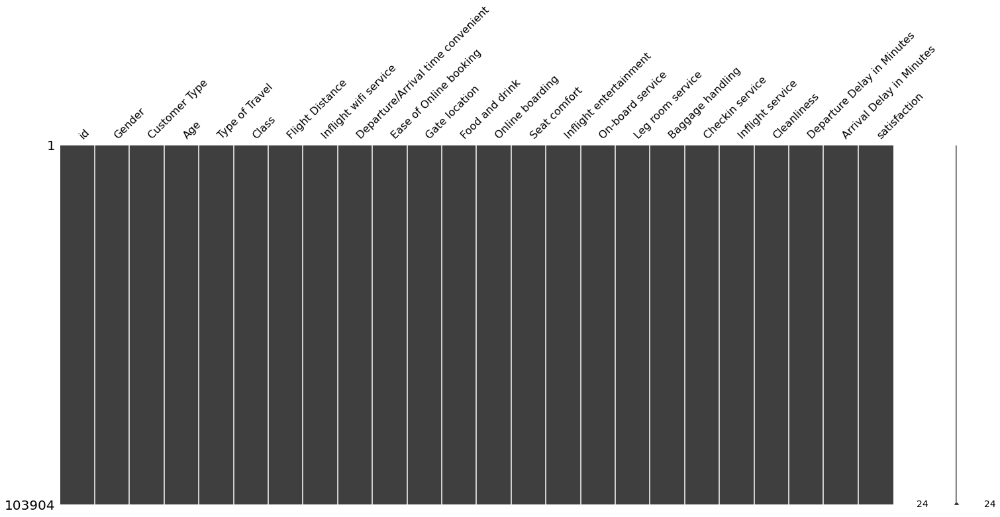

In [23]:
msno.matrix(df)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 103904 non-null  int64  
 1   Gender                             103904 non-null  object 
 2   Customer Type                      103904 non-null  object 
 3   Age                                103904 non-null  int64  
 4   Type of Travel                     103904 non-null  object 
 5   Class                              103904 non-null  object 
 6   Flight Distance                    103904 non-null  int64  
 7   Inflight wifi service              103904 non-null  int64  
 8   Departure/Arrival time convenient  103904 non-null  int64  
 9   Ease of Online booking             103904 non-null  int64  
 10  Gate location                      103904 non-null  int64  
 11  Food and drink                     1039

In [25]:
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,satisfied
103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


In [26]:
df["Arrival Delay in Minutes"]=df["Arrival Delay in Minutes"].astype(int)
df.dtypes

id                                    int64
Gender                               object
Customer Type                        object
Age                                   int64
Type of Travel                       object
Class                                object
Flight Distance                       int64
Inflight wifi service                 int64
Departure/Arrival time convenient     int64
Ease of Online booking                int64
Gate location                         int64
Food and drink                        int64
Online boarding                       int64
Seat comfort                          int64
Inflight entertainment                int64
On-board service                      int64
Leg room service                      int64
Baggage handling                      int64
Checkin service                       int64
Inflight service                      int64
Cleanliness                           int64
Departure Delay in Minutes            int64
Arrival Delay in Minutes        

In [27]:
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied
103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied
103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied
103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied


In [29]:
df["Inflight wifi service"].value_counts(1,dropna=False)

3    0.248961
2    0.248595
4    0.190503
1    0.171697
5    0.110381
0    0.029864
Name: Inflight wifi service, dtype: float64

In [30]:
df.columns[7:20]

Index(['Inflight wifi service', 'Departure/Arrival time convenient',
       'Ease of Online booking', 'Gate location', 'Food and drink',
       'Online boarding', 'Seat comfort', 'Inflight entertainment',
       'On-board service', 'Leg room service', 'Baggage handling',
       'Checkin service', 'Inflight service'],
      dtype='object')

In [31]:
df[df.columns[8]].value_counts(1,dropna=False)

4    0.245862
5    0.215612
3    0.172910
2    0.165451
1    0.149157
0    0.051009
Name: Departure/Arrival time convenient, dtype: float64

In [32]:
df[df.columns[9]].value_counts(1,dropna=False)

3    0.235304
2    0.231185
4    0.188357
1    0.168665
5    0.133306
0    0.043184
Name: Ease of Online booking, dtype: float64

In [33]:
df[df.columns[10]].value_counts(1,dropna=False)

3    0.275033
4    0.235082
2    0.187279
1    0.169021
5    0.133575
0    0.000010
Name: Gate location, dtype: float64

In [34]:
df[df.columns[11]].value_counts(1,dropna=False)

4    0.234438
5    0.214746
3    0.214621
2    0.211618
1    0.123547
0    0.001030
Name: Food and drink, dtype: float64

In [35]:
df[df.columns[12]].value_counts(1,dropna=False)

4    0.296062
3    0.209848
5    0.199347
2    0.168473
1    0.102903
0    0.023368
Name: Online boarding, dtype: float64

In [36]:
df[df.columns[13]].value_counts(1,dropna=False)

4    0.305715
5    0.254754
3    0.179935
2    0.143373
1    0.116213
0    0.000010
Name: Seat comfort, dtype: float64

In [37]:
df[df.columns[14]].value_counts(1,dropna=False)

4    0.283175
5    0.242657
3    0.184199
2    0.169743
1    0.120092
0    0.000135
Name: Inflight entertainment, dtype: float64

In [40]:
df.duplicated(subset="id").sum()

0

In [43]:
sin_importancia=["id"]
vcont = ["Age","Flight Distance","Departure Delay in Minutes","Arrival Delay in Minutes"]
vdisc = [c for c in df.columns if c not in sin_importancia+vcont]
vdisc

['Gender',
 'Customer Type',
 'Type of Travel',
 'Class',
 'Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'satisfaction']

# EDA

In [61]:
len(vdisc)

19

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword wil

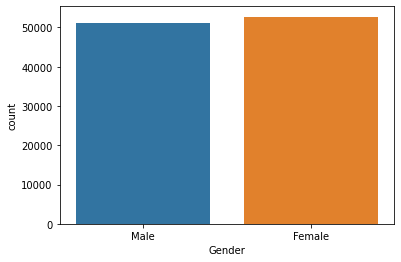

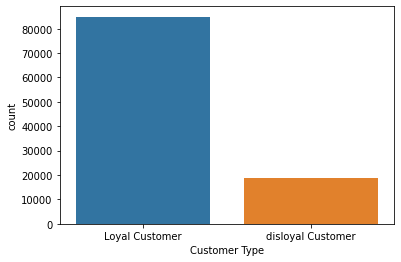

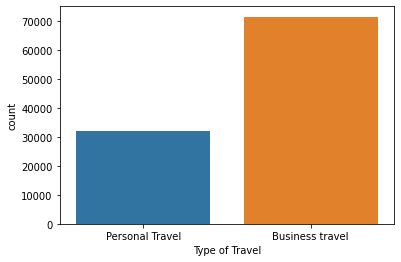

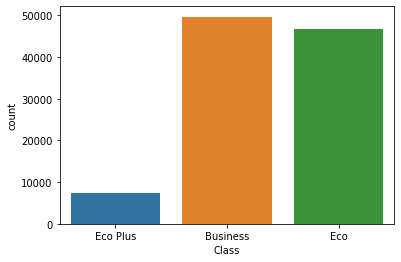

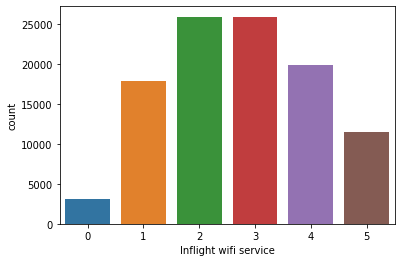

...

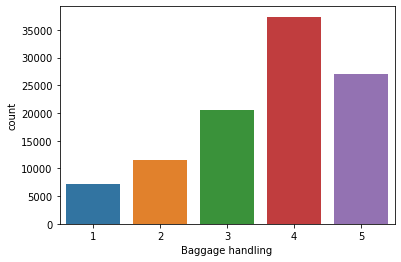

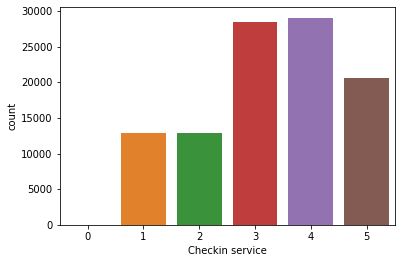

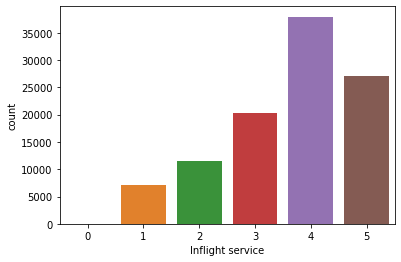

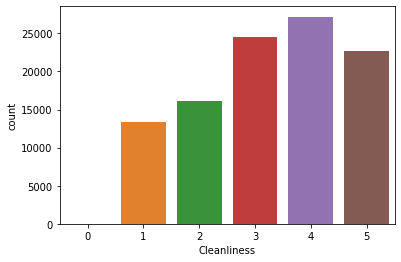

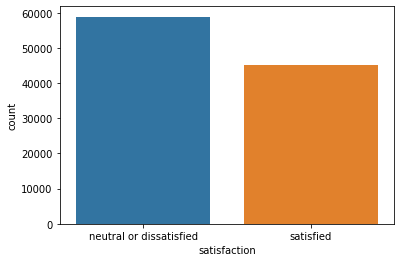

In [65]:
for i in vdisc:
    plt.figure()
    sns.countplot(df[i])

In [67]:
for c in vdisc:
    print(c)
    print("\n")
    print(df[c].value_counts(1,dropna=False))
    print("___________")
    print("\n")

Gender


Female    0.507459
Male      0.492541
Name: Gender, dtype: float64
___________


Customer Type


Loyal Customer       0.817322
disloyal Customer    0.182678
Name: Customer Type, dtype: float64
___________


Type of Travel


Business travel    0.689627
Personal Travel    0.310373
Name: Type of Travel, dtype: float64
___________


Class


Business    0.477989
Eco         0.449886
Eco Plus    0.072124
Name: Class, dtype: float64
___________


Inflight wifi service


3    0.248961
2    0.248595
4    0.190503
1    0.171697
5    0.110381
0    0.029864
Name: Inflight wifi service, dtype: float64
___________


Departure/Arrival time convenient


4    0.245862
5    0.215612
3    0.172910
2    0.165451
1    0.149157
0    0.051009
Name: Departure/Arrival time convenient, dtype: float64
___________


Ease of Online booking


3    0.235304
2    0.231185
4    0.188357
1    0.168665
5    0.133306
0    0.043184
Name: Ease of Online booking, dtype: float64
___________


Gate location


3    0.

## Variables continuas

In [68]:
df[vcont].dtypes

Age                           int64
Flight Distance               int64
Departure Delay in Minutes    int64
Arrival Delay in Minutes      int64
dtype: object

In [69]:
df[vcont].describe(percentiles=[0.1,0.25,0.5,0.75,0.9])

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000
mean,39.379706,1189.448375,14.815618,15.133392
std,15.114964,997.147281,38.230901,38.649776
min,7.000000,31.000000,0.000000,0.000000
10%,20.000000,236.000000,0.000000,0.000000
25%,27.000000,414.000000,0.000000,0.000000
50%,40.000000,843.000000,0.000000,0.000000
75%,51.000000,1743.000000,12.000000,13.000000
90%,59.000000,2750.000000,44.000000,44.000000
max,85.000000,4983.000000,1592.000000,1584.000000


In [70]:
df.loc[df["Departure Delay in Minutes"]==1592]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
83741,73471,Female,Loyal Customer,47,Personal Travel,Eco,1120,2,2,2,3,2,4,2,2,4,4,4,2,3,2,1592,1584,neutral or dissatisfied


In [71]:
df.loc[df["Departure Delay in Minutes"]>44]

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
16,71142,Female,Loyal Customer,26,Business travel,Business,2123,3,3,3,3,4,4,4,4,5,3,4,5,4,4,49,51,satisfied
22,43510,Female,Loyal Customer,43,Personal Travel,Eco,752,3,5,3,5,5,4,5,3,3,3,5,3,3,4,52,29,neutral or dissatisfied
24,105420,Female,disloyal Customer,23,Business travel,Eco,452,5,0,5,1,1,5,1,1,4,5,5,3,5,1,54,44,satisfied
32,70594,Female,Loyal Customer,35,Business travel,Business,2611,4,5,4,4,4,4,4,3,3,4,5,4,3,4,109,120,satisfied
55,7467,Female,Loyal Customer,45,Business travel,Business,3334,2,4,2,2,4,5,5,4,4,4,4,3,4,5,51,48,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103843,89597,Female,Loyal Customer,42,Business travel,Business,1076,5,5,5,5,5,5,5,3,5,4,5,5,3,5,171,156,satisfied
103869,55713,Male,Loyal Customer,18,Personal Travel,Eco,895,4,5,4,3,4,1,1,3,5,4,5,1,3,1,212,206,neutral or dissatisfied
103881,9345,Female,Loyal Customer,51,Business travel,Business,384,2,2,2,2,5,5,5,4,4,4,4,3,4,3,54,51,satisfied
103885,122528,Male,Loyal Customer,40,Business travel,Business,500,4,4,4,4,5,4,4,3,3,3,3,5,3,4,47,26,satisfied


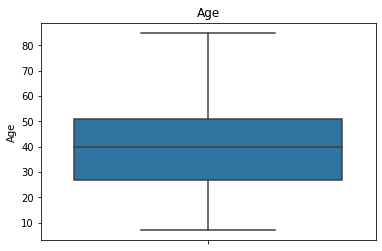

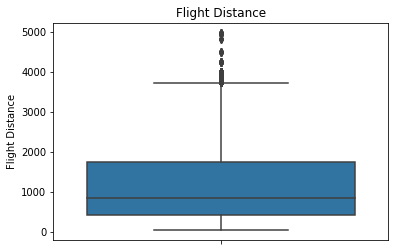

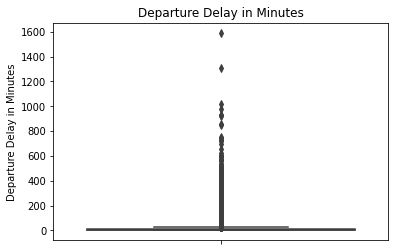

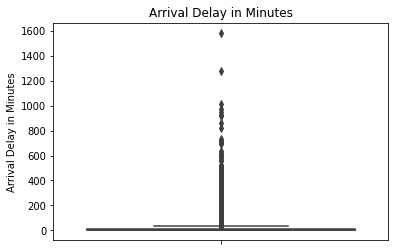

In [73]:
for i in vcont:
    plt.figure()
    ax = sns.boxplot(y=i, data=df).set(title=i)

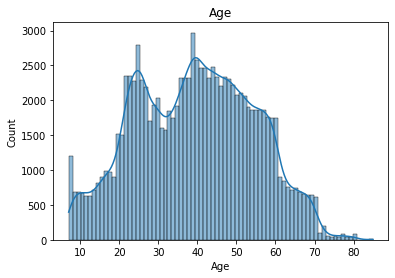

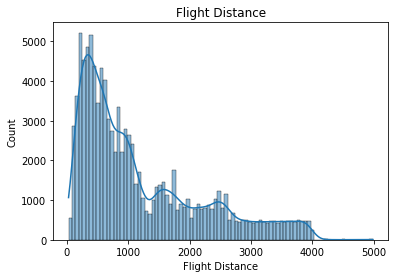

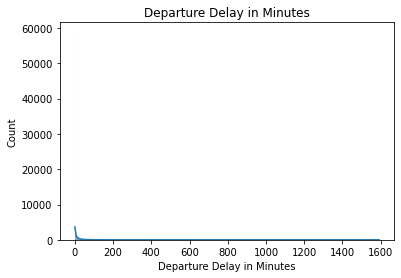

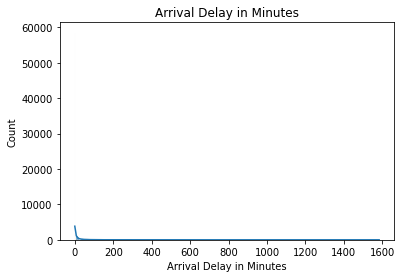

In [74]:
for i in vcont:
    plt.figure()
    sns.histplot(data=df, x=i, kde=True).set(title=i)

# Eliminación de atipicos

De nuestras variables continuas solamente nos interesa eliminar los atipicos de las variables "Arrival Delay in Minutes" y "Depature Delay in Minutes"

In [75]:
#Usaremos el iqr
def iqr_(df, variables, alpha = 1):

    
    for v in variables:
        q3 = df[v].quantile(.75)
        q1 = df[v].quantile(.25)        
        iqr = q3 - q1
        lb, up = q1-(alpha*iqr), q3+(alpha*iqr)
        df = df.loc[(df[v]>=lb) & (df[v]<=up)].copy()
        
    return(df)

In [76]:
#de las variables continuas eliminamos la que es datetime
vcont_iqr = vcont[-2:]
vcont_iqr

['Departure Delay in Minutes', 'Arrival Delay in Minutes']

In [78]:
print(df.shape)
iqr_(df,vcont_iqr,3).shape

(103904, 24)


(88229, 24)

In [79]:
88229/103904

0.8491395903911303

In [80]:
#Se eliminaron muchos datos por lo cual usaremos un metodo multivariante
# Se utilizará isolation Forest
from sklearn.ensemble import IsolationForest

# Seleccionamos el conjunto de datos
df_iso=df[vcont_iqr]

# Entrenamos el modelo
max_features=df_iso.shape[1]
n_estimators=50
max_samples='auto'
contamination=float(0.1)
model=IsolationForest(max_features = max_features, n_estimators=n_estimators, max_samples=max_samples, contamination=contamination)
model.fit(df_iso)

# Predecimos si es Outlier o no
df_iso["outlier"]=model.predict(df_iso)
# Vemos la proporción
df_iso["outlier"].value_counts()

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



 1    93527
-1    10377
Name: outlier, dtype: int64

In [81]:
#Veamos que porcentaje ocupan los -1 del tamaño total
len(df_iso.loc[df_iso["outlier"]==-1])/len(df)

0.09987103480135509

Con el anterior modelo perdemos solamente el 10% de nuestros datos

In [82]:
#Obtenemos el indice de los valores atipicos
indice_outliers = list(df_iso.loc[df_iso["outlier"]==-1].index)

#Los eliminamos del dataset original
df.drop(indice_outliers,axis=0,inplace=True,errors="ignore")
df.shape[0]

93527

In [83]:
93527/103904

0.9001289651986449

In [84]:
df=df.reset_index(drop=True)
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied


## Variables Categoricas

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword wil

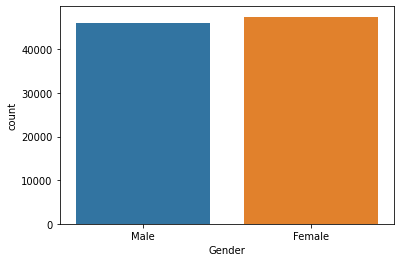

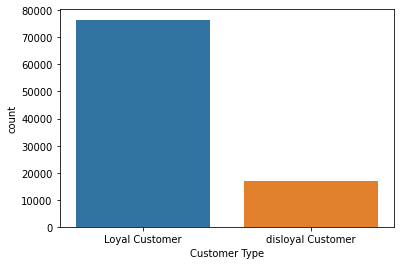

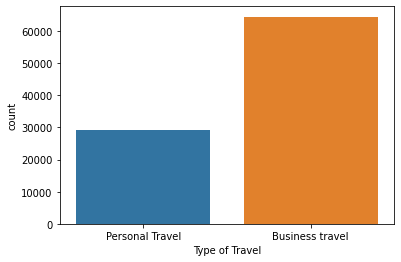

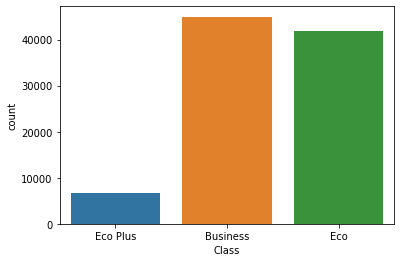

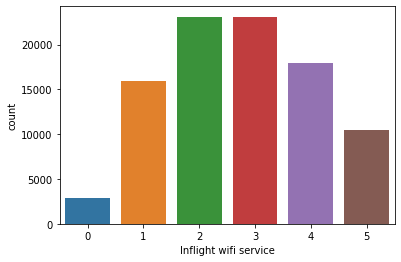

...

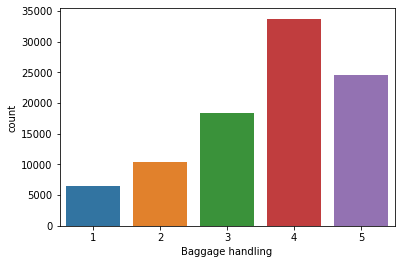

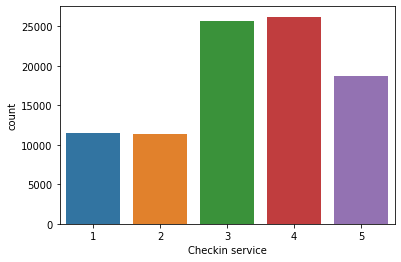

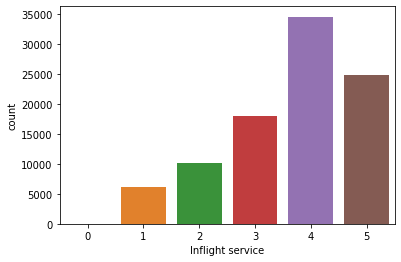

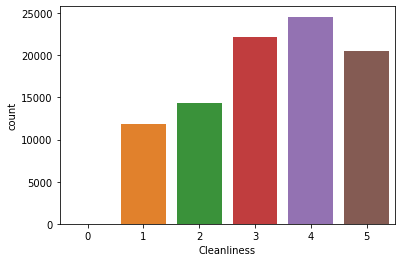

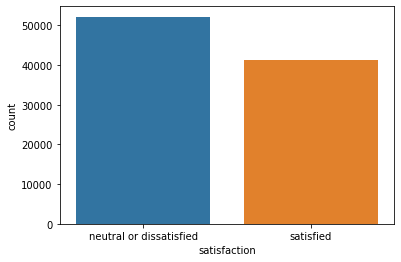

In [85]:
for i in vdisc:
    plt.figure()
    sns.countplot(df[i])

In [86]:
for c in vdisc:
    print(c)
    print("\n")
    print(df[c].value_counts(1,dropna=False))
    print("___________")
    print("\n")

Gender


Female    0.507629
Male      0.492371
Name: Gender, dtype: float64
___________


Customer Type


Loyal Customer       0.818095
disloyal Customer    0.181905
Name: Customer Type, dtype: float64
___________


Type of Travel


Business travel    0.689395
Personal Travel    0.310605
Name: Type of Travel, dtype: float64
___________


Class


Business    0.480706
Eco         0.447807
Eco Plus    0.071487
Name: Class, dtype: float64
___________


Inflight wifi service


3    0.247062
2    0.246859
4    0.191977
1    0.170774
5    0.112385
0    0.030943
Name: Inflight wifi service, dtype: float64
___________


Departure/Arrival time convenient


4    0.246100
5    0.215863
3    0.172047
2    0.164755
1    0.149144
0    0.052092
Name: Departure/Arrival time convenient, dtype: float64
___________


Ease of Online booking


3    0.234499
2    0.229944
4    0.189154
1    0.168283
5    0.133886
0    0.044233
Name: Ease of Online booking, dtype: float64
___________


Gate location


3    0.

## Continuas

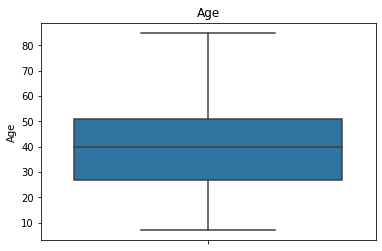

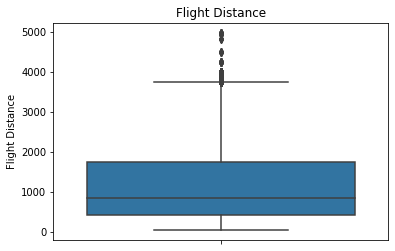

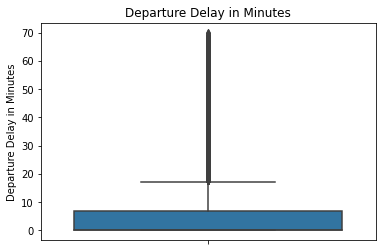

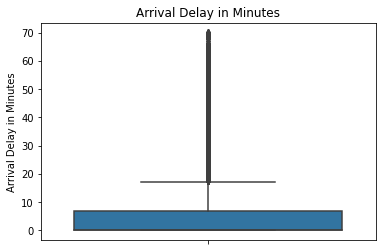

In [88]:
for i in vcont:
    plt.figure()
    ax = sns.boxplot(y=i, data=df).set(title=i)

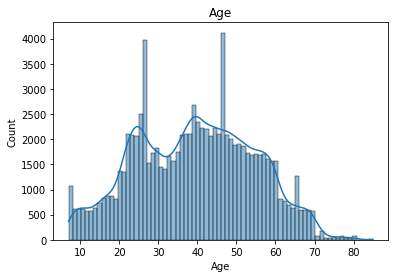

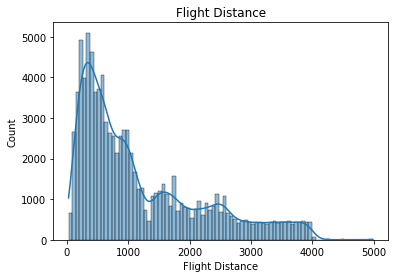

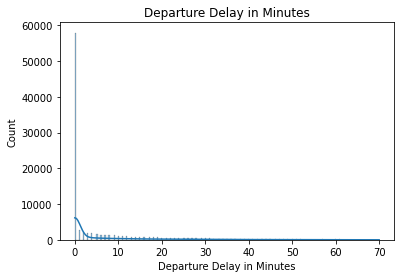

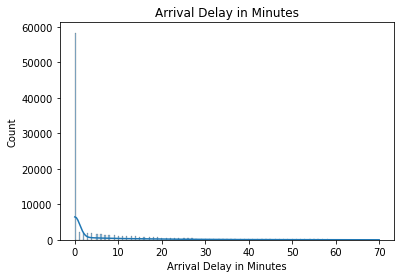

In [89]:
for i in vcont:
    plt.figure()
    sns.histplot(data=df, x=i, kde=True).set(title=i)

In [90]:
df[vcont].describe(percentiles=[0.1,0.25,0.5,0.75,0.9])

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes
count,93527.000000,93527.000000,93527.000000,93527.000000
mean,39.434869,1187.821570,6.151871,5.882783
std,15.115985,999.393813,11.982142,11.365318
min,7.000000,31.000000,0.000000,0.000000
10%,20.000000,236.000000,0.000000,0.000000
25%,27.000000,409.000000,0.000000,0.000000
50%,40.000000,837.000000,0.000000,0.000000
75%,51.000000,1744.000000,7.000000,7.000000
90%,59.000000,2758.000000,23.000000,21.000000
max,85.000000,4983.000000,70.000000,70.000000


# Ingenieria de Variables

Se creó la variable "Total Delay in Minutes" que es la suma de "Departure Delay in Minutes" y "Arrival Delay in Minutes"

In [91]:
df["Total Delay in Minutes"]=df["Departure Delay in Minutes"]+df["Arrival Delay in Minutes"]
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0


In [92]:
vcont=vcont+["Total Delay in Minutes"]

In [94]:
df[vcont].describe(percentiles=[0.1,0.25,0.5,0.75,0.9])

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
count,93527.000000,93527.000000,93527.000000,93527.000000,93527.000000
mean,39.434869,1187.821570,6.151871,5.882783,12.034653
std,15.115985,999.393813,11.982142,11.365318,22.519248
min,7.000000,31.000000,0.000000,0.000000,0.000000
10%,20.000000,236.000000,0.000000,0.000000,0.000000
25%,27.000000,409.000000,0.000000,0.000000,0.000000
50%,40.000000,837.000000,0.000000,0.000000,0.000000
75%,51.000000,1744.000000,7.000000,7.000000,13.000000
90%,59.000000,2758.000000,23.000000,21.000000,42.000000
max,85.000000,4983.000000,70.000000,70.000000,132.000000


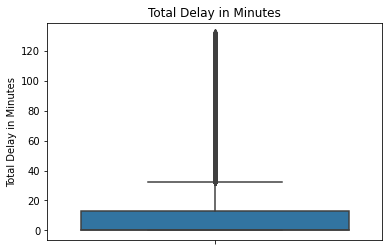

In [95]:
ax = sns.boxplot(y=vcont[-1], data=df).set(title=vcont[-1])

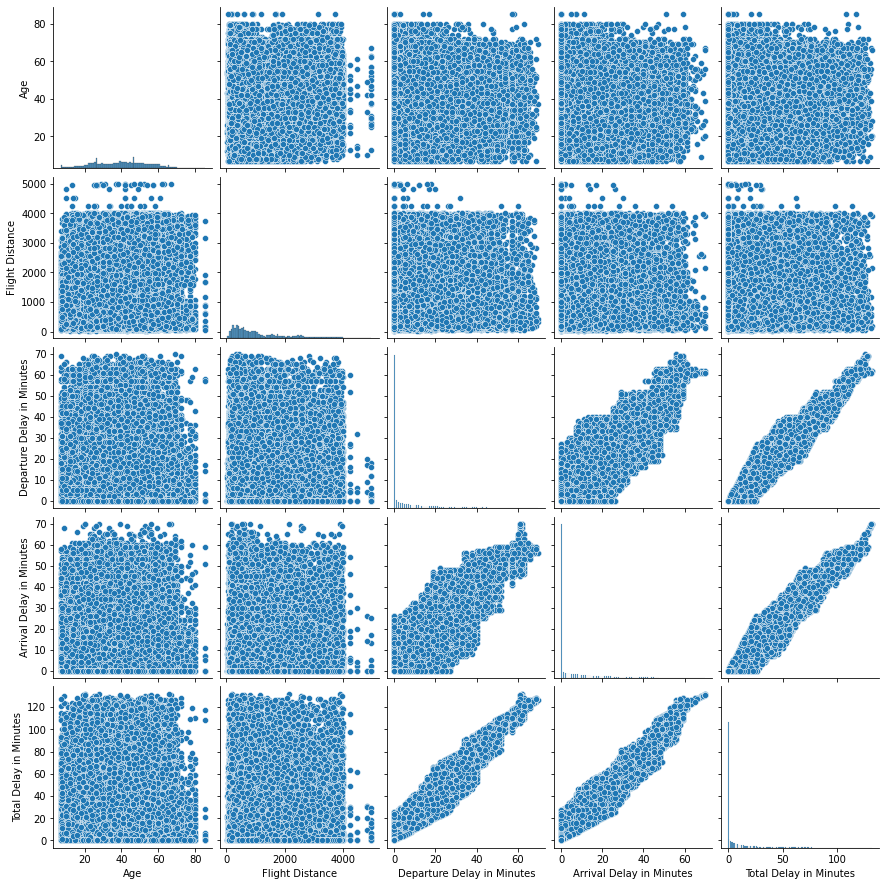

In [96]:
sns.pairplot(df[vcont])

In [97]:
import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import plot,iplot
import cufflinks as cf
pd.options.plotting.backend = "plotly"
cf.go_offline()
#Veamos las correlaciones entre variables conyinuas
df[[x for x in vcont]].corr(method="spearman").iplot(kind="heatmap",colorscale="orrd",title="Matriz de Correlación")

In [98]:
correlaciones = df[[x for x in vcont]].corr(method="spearman")
correlaciones.style.background_gradient(cmap='Blues')

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
Age,1.000000,0.072976,-0.007204,-0.007682,-0.009562
Flight Distance,0.072976,1.000000,0.028538,-0.007518,0.026510
Departure Delay in Minutes,-0.007204,0.028538,1.000000,0.658105,0.876095
Arrival Delay in Minutes,-0.007682,-0.007518,0.658105,1.000000,0.889091
Total Delay in Minutes,-0.009562,0.026510,0.876095,0.889091,1.000000


In [99]:
df.corr(method="spearman").iplot(kind="heatmap",colorscale="orrd",title="Matriz de Correlación")

In [101]:
df.corr(method="spearman").style.background_gradient(cmap='Blues')

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
id,1.000000,0.024189,0.131429,-0.025143,-0.003192,0.011968,-0.001785,-0.003522,0.056835,0.053235,-0.002737,0.051125,0.040025,0.069414,0.076772,0.072858,0.021009,0.095036,0.024104,0.066747
Age,0.024189,1.000000,0.072976,0.015692,0.034743,0.019579,-0.003148,0.017973,0.218736,0.165141,0.082058,0.072410,0.054434,-0.028899,0.038210,-0.033607,0.054626,-0.007204,-0.007682,-0.009562
Flight Distance,0.131429,0.072976,1.000000,0.004743,-0.013709,0.064567,0.000977,0.043050,0.197144,0.139109,0.107165,0.103025,0.118674,0.060179,0.070900,0.061362,0.081747,0.028538,-0.007518,0.026510
Inflight wifi service,-0.025143,0.015692,0.004743,1.000000,0.343084,0.718829,0.338418,0.118566,0.437603,0.113056,0.199481,0.116730,0.152072,0.111816,0.035215,0.104409,0.125461,-0.029577,-0.035987,-0.035192
Departure/Arrival time convenient,-0.003192,0.034743,-0.013709,0.343084,1.000000,0.439337,0.449168,0.002068,0.063220,0.012668,-0.012970,0.070142,0.003059,0.086107,0.102074,0.089766,0.015296,-0.005288,-0.007467,-0.006458
Ease of Online booking,0.011968,0.019579,0.064567,0.718829,0.439337,1.000000,0.461271,0.019984,0.376032,0.026850,0.044340,0.038333,0.097276,0.037950,0.009008,0.035889,0.015455,-0.011212,-0.014508,-0.013760
Gate location,-0.001785,-0.003148,0.000977,0.338418,0.449168,0.461271,1.000000,0.000377,-0.001459,0.002670,0.004090,-0.028202,-0.007597,-0.008353,-0.037422,-0.008172,-0.002610,0.001546,0.003034,0.002443
Food and drink,-0.003522,0.017973,0.043050,0.118566,0.002068,0.019984,0.000377,1.000000,0.232637,0.556980,0.618687,0.055453,0.030841,0.041273,0.069616,0.038461,0.648912,-0.011180,-0.022178,-0.017158
Online boarding,0.056835,0.218736,0.197144,0.437603,0.063220,0.376032,-0.001459,0.232637,1.000000,0.427714,0.305913,0.179291,0.141220,0.115548,0.199083,0.108450,0.330554,-0.027043,-0.046035,-0.038330
Seat comfort,0.053235,0.165141,0.139109,0.113056,0.012668,0.026850,0.002670,0.556980,0.427714,1.000000,0.614598,0.148878,0.122637,0.102940,0.176938,0.096826,0.657224,-0.007196,-0.025493,-0.015659


In [102]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")

# Estandarizacion y proyección de los datos

## PCA

In [103]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X= df[vcont]
X

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,13,460,25,18,43
1,25,235,1,6,7
2,26,1142,0,0,0
3,25,562,11,9,20
4,61,214,0,0,0
...,...,...,...,...,...
93522,23,192,3,0,3
93523,49,2347,0,0,0
93524,30,1995,7,14,21
93525,22,1000,0,0,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



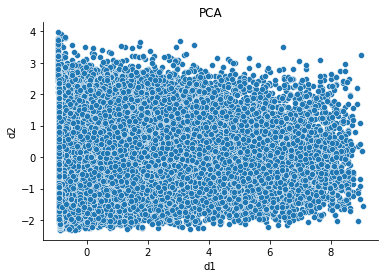

In [104]:
pi = make_pipeline(StandardScaler(),PCA(n_components=2)) #Esa funcion con make_pipeline
Xp = pd.DataFrame(pi.fit_transform(X),columns=['d1','d2'])


sns.scatterplot(Xp["d1"], Xp["d2"]).set(title="PCA")
sns.despine()
plt.show()

In [105]:
pi.steps[-1][-1].explained_variance_ratio_.cumsum() #Varianza explicada

array([0.57211734, 0.7921263 ])

Text(0.5, 0, 'd3')

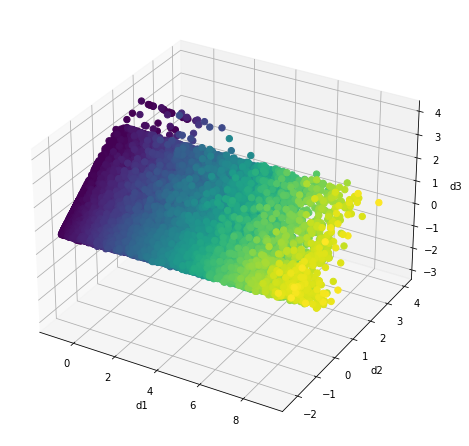

In [107]:
from mpl_toolkits.mplot3d import Axes3D
pi_3 = make_pipeline(StandardScaler(),PCA(n_components=3)) #Esa funcion con make_pipeline
Xp_3 = pd.DataFrame(pi_3.fit_transform(X),columns=['d1','d2','d3'])

# axes instance
fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)


# plot
sc = ax.scatter(Xp_3["d1"],Xp_3["d2"],Xp_3["d3"], s=40, c=Xp_3['d1'], marker='o', alpha=1)
ax.set_xlabel('d1')
ax.set_ylabel('d2')
ax.set_zlabel('d3')


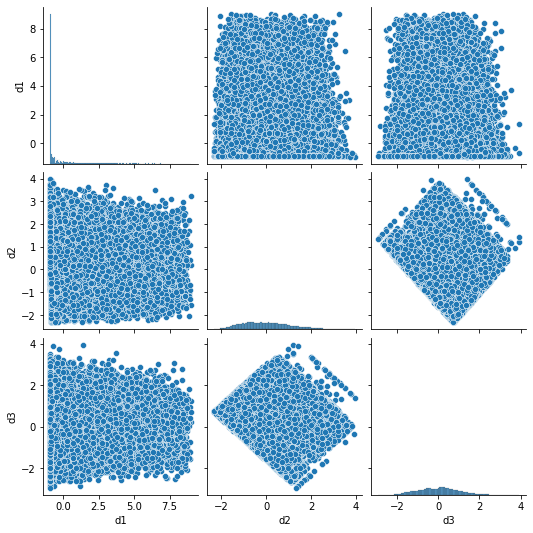

In [108]:
sns.pairplot(Xp_3)

In [109]:
pi_3.steps[-1][-1].explained_variance_ratio_.cumsum() #Varianza explicada

array([0.57211734, 0.7921263 , 0.97210768])

In [110]:
Xp.to_csv("PCA.csv",index=False,encoding="utf-8")
Xp_3.to_csv("PCA_3d.csv",index=False,encoding="utf-8")

## TSNE

In [111]:
#Estandarizamos la base
from sklearn.preprocessing import MinMaxScaler
sm = MinMaxScaler()
Xmm = pd.DataFrame(sm.fit_transform(X),columns=X.columns)
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,0.076923,0.086632,0.357143,0.257143,0.325758
1,0.230769,0.041195,0.014286,0.085714,0.053030
2,0.243590,0.224354,0.000000,0.000000,0.000000
3,0.230769,0.107229,0.157143,0.128571,0.151515
4,0.692308,0.036955,0.000000,0.000000,0.000000
...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727
93523,0.538462,0.467690,0.000000,0.000000,0.000000
93524,0.294872,0.396607,0.100000,0.200000,0.159091
93525,0.192308,0.195679,0.000000,0.000000,0.000000


In [113]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=10, random_state=1000) #dim 2, perplexity vecinos que estimamos
Xmm_sample=Xmm.sample(frac=0.2) #Se crea una muestra del 20%
Xmm_sample

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
49493,0.461538,0.040388,0.000000,0.000000,0.000000
67655,0.628205,0.630452,0.000000,0.000000,0.000000
25333,0.243590,0.020800,0.000000,0.000000,0.000000
70585,0.230769,0.210218,0.085714,0.000000,0.045455
53996,0.653846,0.318659,0.028571,0.000000,0.015152
...,...,...,...,...,...
71383,0.243590,0.185178,0.000000,0.000000,0.000000
27520,0.205128,0.212843,0.171429,0.042857,0.113636
52224,0.474359,0.497577,0.000000,0.000000,0.000000
33887,0.525641,0.291801,0.000000,0.000000,0.000000


In [115]:
indice = list(Xmm_sample.index)

In [116]:
Xtmm = tsne.fit_transform(Xmm_sample)

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



ValueError: Shape of passed values is (18705, 2), indices imply (93527, 2)

In [118]:
Xtmm = pd.DataFrame(Xtmm, columns=['x', 'y'], index=Xmm_sample.index)
Xtmm

,x,y
49493,92.460770,35.433300
67655,-50.859261,55.752892
25333,-109.708778,43.756592
70585,59.609055,-38.454346
53996,-43.915325,-39.624649
...,...,...
71383,64.307793,-63.114285
27520,29.104956,-5.070443
52224,-45.222992,32.217705
33887,-59.956078,-16.113598


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



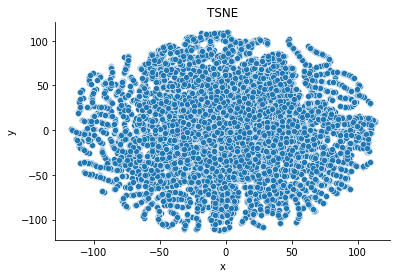

In [119]:
sns.scatterplot(Xtmm["x"], Xtmm["y"]).set(title="TSNE")
sns.despine()
plt.show()

In [121]:
tsne.kl_divergence_ #Divergencia de kurbal

1.401153802871704

In [120]:
Xtmm.to_csv("TSNE.csv",encoding="utf-8")
Xmm.to_csv("Base_estandarizada.csv",encoding="utf-8")

# Modelos de Clustering

## Clustering Optimizacion

### K means

In [2]:
Xmm=pd.read_csv("Base_estandarizada.csv",encoding="utf-8")
Xmm=Xmm[Xmm.columns[1:]]
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,0.076923,0.086632,0.357143,0.257143,0.325758
1,0.230769,0.041195,0.014286,0.085714,0.053030
2,0.243590,0.224354,0.000000,0.000000,0.000000
3,0.230769,0.107229,0.157143,0.128571,0.151515
4,0.692308,0.036955,0.000000,0.000000,0.000000
...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727
93523,0.538462,0.467690,0.000000,0.000000,0.000000
93524,0.294872,0.396607,0.100000,0.200000,0.159091
93525,0.192308,0.195679,0.000000,0.000000,0.000000


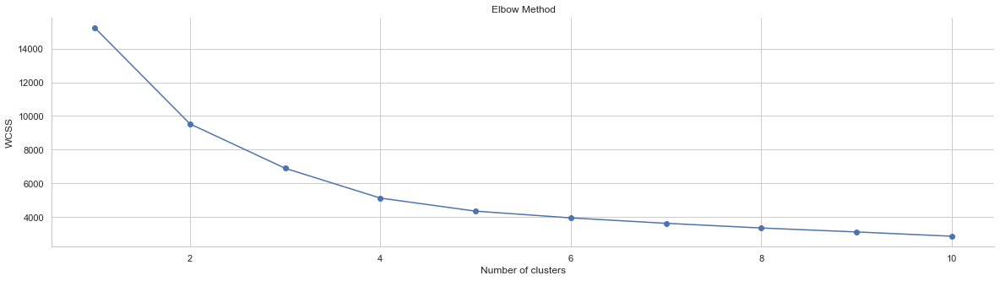

In [3]:
from sklearn.cluster import KMeans
#Calculamos el wcss o la inercia
wcss = []
for i in range(1, 11): #Rango de numero de clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    """Intanciamos el init es k-means++ para que no afecte tanto el cambio
    de centroides, en max iter es el numero de veces"""
    kmeans.fit(Xmm)
    wcss.append(kmeans.inertia_) #Guardamos la inercia
sns.set_theme(style="whitegrid")
plt.subplots(figsize=(20,5))
plt.plot(range(1, 11), wcss,marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
sns.despine()
plt.show()

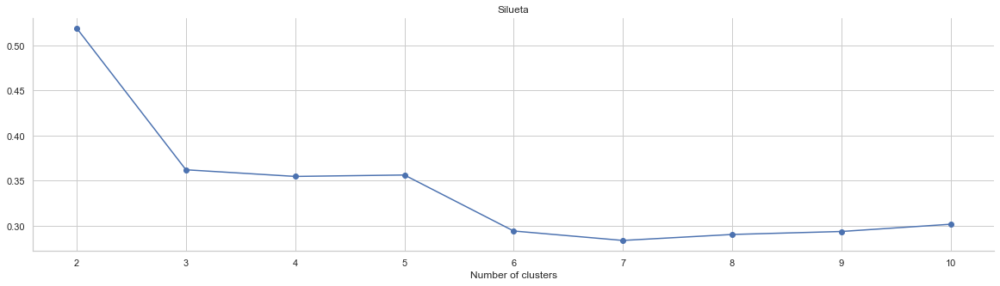

In [4]:
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples #Metricas
lst_silhouette = []
for k in range(2,11):
    cl_sil = KMeans(n_clusters=k,init='k-means++', max_iter=300, n_init=10, random_state=0)
    cl_sil.fit(Xmm)
    lst_silhouette.append(silhouette_score(Xmm,cl_sil.predict(Xmm)))
    #compara maxima cohension y separacion
plt.subplots(figsize=(20,5))
plt.plot(range(2, 11), lst_silhouette,marker='o')
plt.title('Silueta')
plt.xlabel('Number of clusters')
sns.despine()
plt.show()

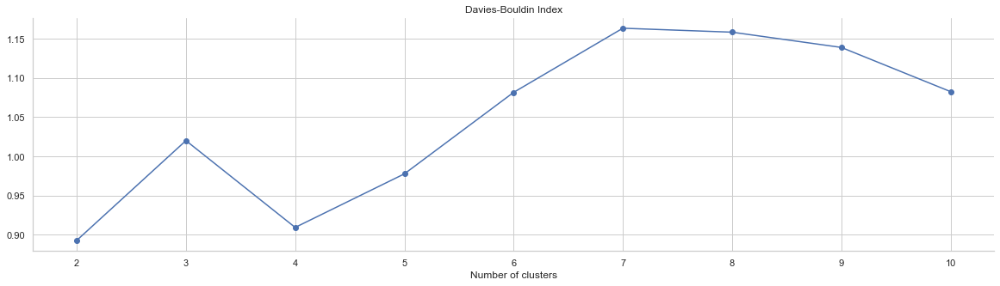

In [5]:
lst_dbscore=[]
for k in range(2,11):
    cl_db = KMeans(n_clusters=k,init='k-means++', max_iter=300, n_init=10, random_state=0)
    cl_db.fit(Xmm)
    lst_dbscore.append(davies_bouldin_score(Xmm,cl_db.predict(Xmm)))
    #Mas pequeño mejor
plt.subplots(figsize=(20,5))
plt.plot(range(2, 11), lst_dbscore,marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('Number of clusters')
sns.despine()
plt.show()

Vamos a probar con 2 y 4

In [9]:
Xp=pd.read_csv("PCA.csv",encoding="utf-8")
df = pd.read_csv("Data_sinout.csv",encoding="utf-8")
Xp

,d1,d2
0,2.329623,-1.733088
1,-0.362054,-1.353643
2,-0.900097,-0.667292
3,0.603948,-1.113265
4,-0.903672,0.313348
...,...,...
93522,-0.671871,-1.477245
93523,-0.913511,1.261135
93524,0.680341,0.132215
93525,-0.898176,-0.954868


In [10]:
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



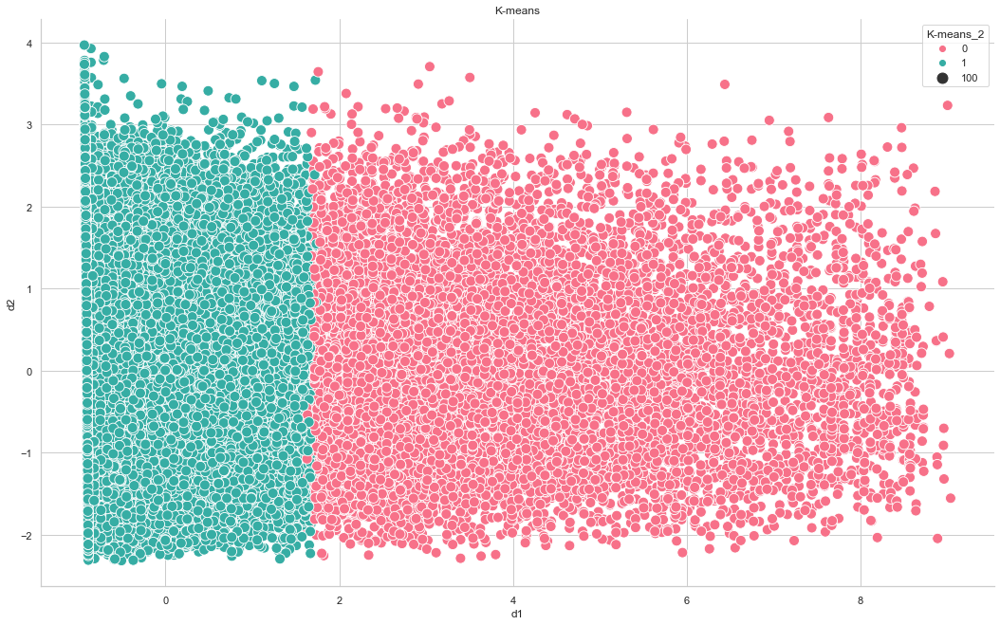

In [12]:
current_palette = sns.color_palette()
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
Xp["K-means_2"]=df["K-means_2"]=Xmm["K-means_2"] = kmeans.fit_predict(Xmm) #Asigna datos al grupo que le corresponda
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["K-means_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="K-means")
sns.despine()
plt.show()

In [13]:
Xmm.drop("K-means_3",axis=1,inplace=True)
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,K-means_2
0,0.076923,0.086632,0.357143,0.257143,0.325758,0
1,0.230769,0.041195,0.014286,0.085714,0.053030,1
2,0.243590,0.224354,0.000000,0.000000,0.000000,1
3,0.230769,0.107229,0.157143,0.128571,0.151515,1
4,0.692308,0.036955,0.000000,0.000000,0.000000,1
...,...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727,1
93523,0.538462,0.467690,0.000000,0.000000,0.000000,1
93524,0.294872,0.396607,0.100000,0.200000,0.159091,1
93525,0.192308,0.195679,0.000000,0.000000,0.000000,1


In [14]:
Xmm["K-means_2"].value_counts(1,dropna=False)

1    0.876453
0    0.123547
Name: K-means_2, dtype: float64

In [15]:
Xtmm=pd.read_csv("TSNE.csv",encoding="utf-8")
Xtmm

,Unnamed: 0,x,y
0,49493,92.460770,35.433300
1,67655,-50.859260,55.752890
2,25333,-109.708780,43.756590
3,70585,59.609055,-38.454346
4,53996,-43.915325,-39.624650
...,...,...,...
18700,71383,64.307790,-63.114285
18701,27520,29.104956,-5.070443
18702,52224,-45.222992,32.217705
18703,33887,-59.956078,-16.113598


In [21]:
Xmm.loc[Xmm.index.isin(list(Xtmm[Xtmm.columns[0]]))]

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,K-means_2
0,0.076923,0.086632,0.357143,0.257143,0.325758,0
6,0.512821,0.251414,0.128571,0.328571,0.242424,1
12,0.589744,0.162157,0.400000,0.114286,0.272727,0
18,0.487179,0.495759,0.100000,0.071429,0.090909,1
19,0.397436,0.086632,0.242857,0.257143,0.265152,0
...,...,...,...,...,...,...
93505,0.294872,0.465872,0.028571,0.000000,0.015152,1
93514,0.461538,0.778271,0.000000,0.000000,0.000000,1
93515,0.628205,0.104806,0.000000,0.000000,0.000000,1
93518,0.217949,0.206785,0.185714,0.142857,0.174242,1


In [19]:
list(Xtmm[Xtmm.columns[0]])

[49493,
 67655,
 25333,
 70585,
 53996,
 44547,
 64095,
 75386,
 61701,
 39760,
 83676,
 24984,
 36510,
 30186,
 72892,
 59110,
 79905,
 50366,
 84347,
 52600,
 74442,
 22435,
 42067,
 93383,
 28960,
 89713,
 41362,
 93189,
 55042,
 27221,
 27321,
 8132,
 67518,
 55671,
 62413,
 41502,
 8649,
 19991,
 40906,
 42422,
 60648,
 79864,
 8829,
 67123,
 66412,
 43376,
 29922,
 50717,
 49350,
 76654,
 63152,
 27052,
 12756,
 613,
 79994,
 65114,
 46494,
 56094,
 52229,
 43985,
 20686,
 88536,
 5567,
 84215,
 70027,
 3283,
 67695,
 35468,
 21653,
 70242,
 31108,
 83942,
 40972,
 65106,
 67064,
 76914,
 1160,
 87860,
 47795,
 52232,
 76670,
 74106,
 16348,
 76841,
 2976,
 43238,
 56576,
 10047,
 10916,
 55687,
 5574,
 34449,
 88413,
 82841,
 35207,
 68281,
 23542,
 60337,
 33435,
 10724,
 83576,
 46117,
 30681,
 38967,
 2758,
 54158,
 34816,
 67932,
 61783,
 66720,
 8770,
 71827,
 61425,
 86976,
 20916,
 29865,
 46036,
 59927,
 40160,
 74344,
 29243,
 13430,
 69957,
 47164,
 80580,
 35980,
 907

In [22]:
Xtmm=Xtmm.merge(Xmm,how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,K-means_2
0,49493,92.460770,35.433300,0.461538,0.040388,0.000000,0.000000,0.000000,1
1,67655,-50.859260,55.752890,0.628205,0.630452,0.000000,0.000000,0.000000,1
2,25333,-109.708780,43.756590,0.243590,0.020800,0.000000,0.000000,0.000000,1
3,70585,59.609055,-38.454346,0.230769,0.210218,0.085714,0.000000,0.045455,1
4,53996,-43.915325,-39.624650,0.653846,0.318659,0.028571,0.000000,0.015152,1
...,...,...,...,...,...,...,...,...,...
18700,71383,64.307790,-63.114285,0.243590,0.185178,0.000000,0.000000,0.000000,1
18701,27520,29.104956,-5.070443,0.205128,0.212843,0.171429,0.042857,0.113636,1
18702,52224,-45.222992,32.217705,0.474359,0.497577,0.000000,0.000000,0.000000,1
18703,33887,-59.956078,-16.113598,0.525641,0.291801,0.000000,0.000000,0.000000,1


In [23]:
Xtmm=Xtmm[["Unnamed: 0","x","y","K-means_2"]]
Xtmm

,Unnamed: 0,x,y,K-means_2
0,49493,92.460770,35.433300,1
1,67655,-50.859260,55.752890,1
2,25333,-109.708780,43.756590,1
3,70585,59.609055,-38.454346,1
4,53996,-43.915325,-39.624650,1
...,...,...,...,...
18700,71383,64.307790,-63.114285,1
18701,27520,29.104956,-5.070443,1
18702,52224,-45.222992,32.217705,1
18703,33887,-59.956078,-16.113598,1


In [25]:
Xmm.loc[Xmm.index == 49493]

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,K-means_2
49493,0.461538,0.040388,0.0,0.0,0.0,1


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



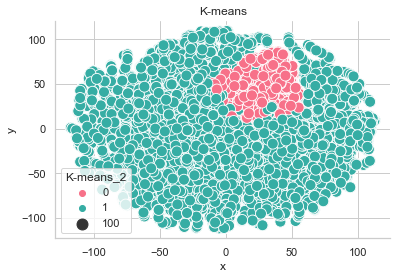

In [26]:
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["K-means_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="K-means")
sns.despine()
plt.show()

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='K-means_2', ylabel='count'>

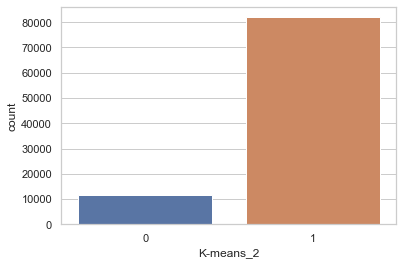

In [28]:
sns.countplot(Xmm["K-means_2"])

In [31]:
Xmm.drop("K-means_2",axis=1,inplace=True)
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,0.076923,0.086632,0.357143,0.257143,0.325758
1,0.230769,0.041195,0.014286,0.085714,0.053030
2,0.243590,0.224354,0.000000,0.000000,0.000000
3,0.230769,0.107229,0.157143,0.128571,0.151515
4,0.692308,0.036955,0.000000,0.000000,0.000000
...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727
93523,0.538462,0.467690,0.000000,0.000000,0.000000
93524,0.294872,0.396607,0.100000,0.200000,0.159091
93525,0.192308,0.195679,0.000000,0.000000,0.000000


In [33]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")

In [34]:
pd.to_pickle(kmeans,"K-Means_2.pkl")

#### 4 clusters

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



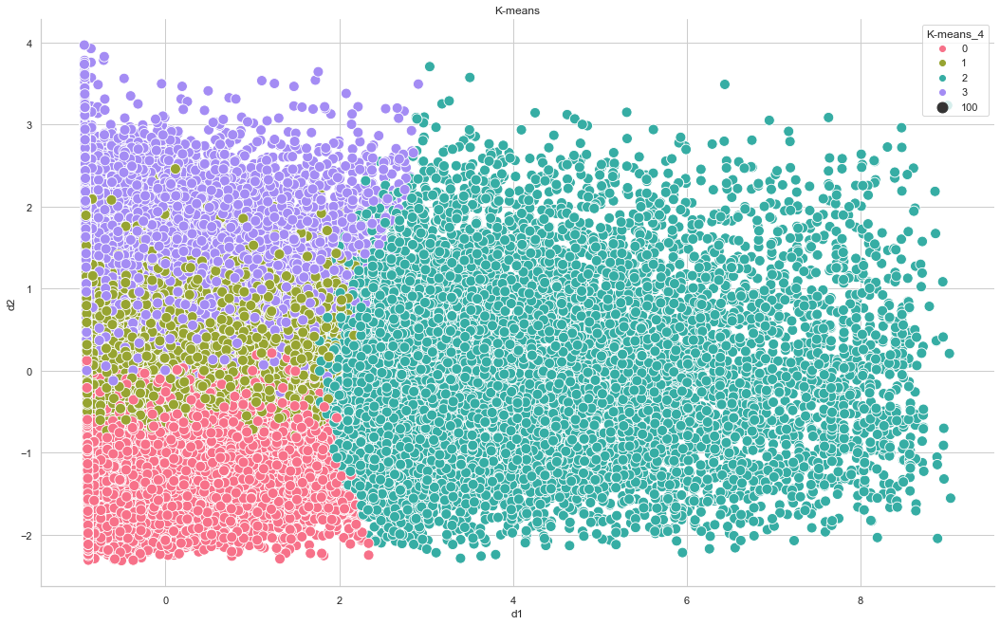

In [35]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
Xp["K-means_4"]=df["K-means_4"]= kmeans.fit_predict(Xmm) #Asigna datos al grupo que le corresponda
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["K-means_4"],palette=sns.color_palette("husl", 4),size=100,sizes=(120, 120)).set(title="K-means")
sns.despine()
plt.show()

In [36]:
df["K-means_4"].value_counts(1,dropna=False)

0    0.348295
1    0.330835
3    0.212570
2    0.108300
Name: K-means_4, dtype: float64

In [38]:
Xtmm

,Unnamed: 0,x,y,K-means_2
0,49493,92.460770,35.433300,1
1,67655,-50.859260,55.752890,1
2,25333,-109.708780,43.756590,1
3,70585,59.609055,-38.454346,1
4,53996,-43.915325,-39.624650,1
...,...,...,...,...
18700,71383,64.307790,-63.114285,1
18701,27520,29.104956,-5.070443,1
18702,52224,-45.222992,32.217705,1
18703,33887,-59.956078,-16.113598,1


In [39]:
Xtmm=Xtmm.merge(df["K-means_4"],how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,K-means_2,K-means_4
0,49493,92.460770,35.433300,1,1
1,67655,-50.859260,55.752890,1,3
2,25333,-109.708780,43.756590,1,0
3,70585,59.609055,-38.454346,1,0
4,53996,-43.915325,-39.624650,1,1
...,...,...,...,...,...
18700,71383,64.307790,-63.114285,1,0
18701,27520,29.104956,-5.070443,1,0
18702,52224,-45.222992,32.217705,1,3
18703,33887,-59.956078,-16.113598,1,1


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



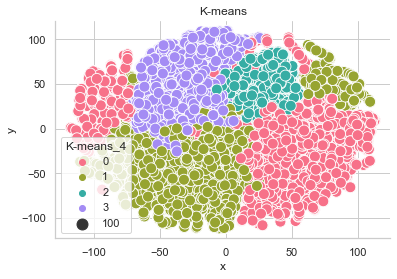

In [40]:
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["K-means_4"],palette=sns.color_palette("husl", 4),size=100,sizes=(120, 120)).set(title="K-means")
sns.despine()
plt.show()

In [43]:
df["K-means_4"].value_counts(1)

0    0.348295
1    0.330835
3    0.212570
2    0.108300
Name: K-means_4, dtype: float64

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='K-means_4', ylabel='count'>

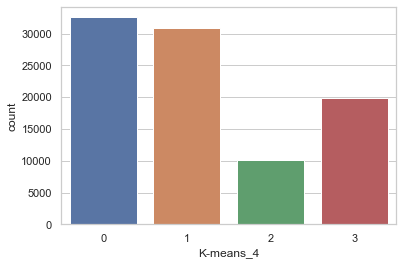

In [42]:
sns.countplot(df["K-means_4"])

In [46]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")
pd.to_pickle(kmeans,"K-Means_4.pkl")

In [50]:
Xp_3=pd.read_csv("PCA_3d.csv",encoding="utf-8")

In [57]:
Xp_3["K-means_2"]=Xp["K-means_2"].astype(str)
Xp_3["K-means_4"]=Xp["K-means_4"].astype(str)
Xp_3

,d1,d2,d3,K-means_2,K-means_4
0,2.329623,-1.733088,0.726908,0,2
1,-0.362054,-1.353643,-0.000967,1,0
2,-0.900097,-0.667292,0.594734,1,0
3,0.603948,-1.113265,0.233833,1,0
4,-0.903672,0.313348,-1.699128,1,1
...,...,...,...,...,...
93522,-0.671871,-1.477245,0.064152,1,0
93523,-0.913511,1.261135,0.371343,1,3
93524,0.680341,0.132215,1.011198,1,3
93525,-0.898176,-0.954868,0.681388,1,0


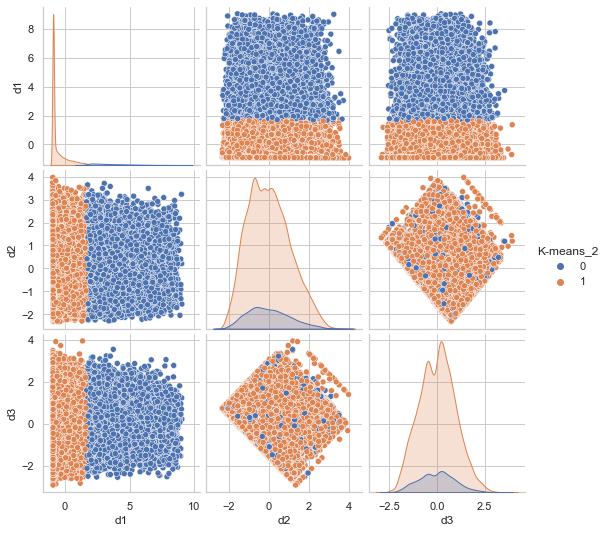

In [58]:
sns.pairplot(data=Xp_3,hue="K-means_2")

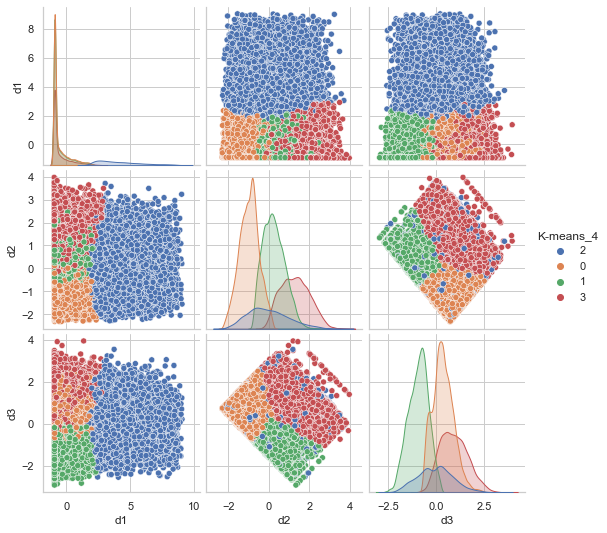

In [59]:
sns.pairplot(data=Xp_3,hue="K-means_4")

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='K-means_4', ylabel='count'>

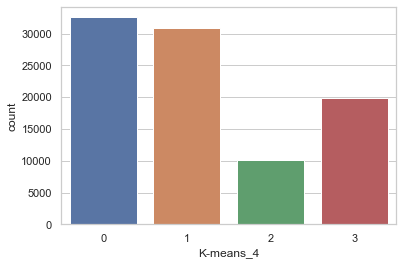

In [60]:
sns.countplot(df["K-means_4"])

## Densidad
### Mezclas Guaseanas

In [2]:
Xmm=pd.read_csv("Base_estandarizada.csv",encoding="utf-8")
Xmm=Xmm[Xmm.columns[1:]]
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,0.076923,0.086632,0.357143,0.257143,0.325758
1,0.230769,0.041195,0.014286,0.085714,0.053030
2,0.243590,0.224354,0.000000,0.000000,0.000000
3,0.230769,0.107229,0.157143,0.128571,0.151515
4,0.692308,0.036955,0.000000,0.000000,0.000000
...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727
93523,0.538462,0.467690,0.000000,0.000000,0.000000
93524,0.294872,0.396607,0.100000,0.200000,0.159091
93525,0.192308,0.195679,0.000000,0.000000,0.000000


In [3]:
Xp=pd.read_csv("PCA.csv",encoding="utf-8")
df = pd.read_csv("Data_sinout.csv",encoding="utf-8")
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes,K-means_2,K-means_4
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43,0,2
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7,1,0
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,0
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20,1,0
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3,1,0
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0,1,3
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21,1,3
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0,1,0


In [4]:
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples #Metricas
from sklearn.mixture import GaussianMixture
ls = []
for k in range(2,10):
    print(k)
    
    gm = GaussianMixture(n_components=k,covariance_type='spherical')
 #calcula el promedio de las siluetas   
    gm.fit(Xmm)
    ls.append((k,silhouette_score(Xmm,gm.predict(Xmm))))
#la silueta toma valores de -1 a 1, entre mas cerca a uno mejor

2
3
4
5
6
7
8
9


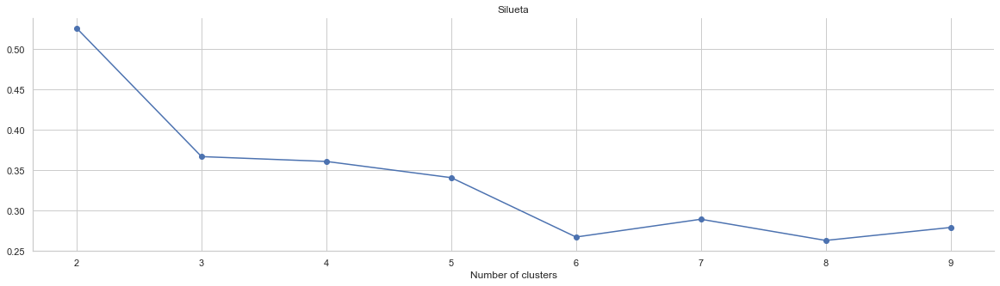

In [6]:
silueta = pd.DataFrame(ls,columns=['k','silueta'])
sns.set_theme(style="whitegrid")
plt.subplots(figsize=(20,5))
plt.plot(silueta['k'],silueta['silueta'],marker='o')
plt.title('Silueta')
plt.xlabel('Number of clusters')
sns.despine()
plt.show()

In [7]:
l_bic = []
l_aic=[]
for k in range(2,10):
    km = GaussianMixture(n_components=k)
    km.fit(Xmm.sample(frac=.1))
    l_bic.append((k,km.bic(Xmm)))
    l_aic.append((k,km.aic(Xmm)))
aic = pd.DataFrame(l_aic,columns=['k','aic'])
bic = pd.DataFrame(l_bic,columns=['k','bic'])

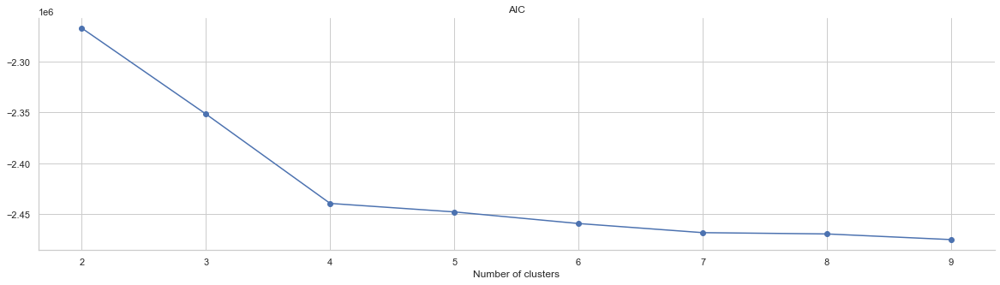

In [8]:
plt.subplots(figsize=(20,5))
plt.plot(aic['k'],aic['aic'],marker='o')
plt.title('AIC')
plt.xlabel('Number of clusters')
sns.despine()
plt.show()

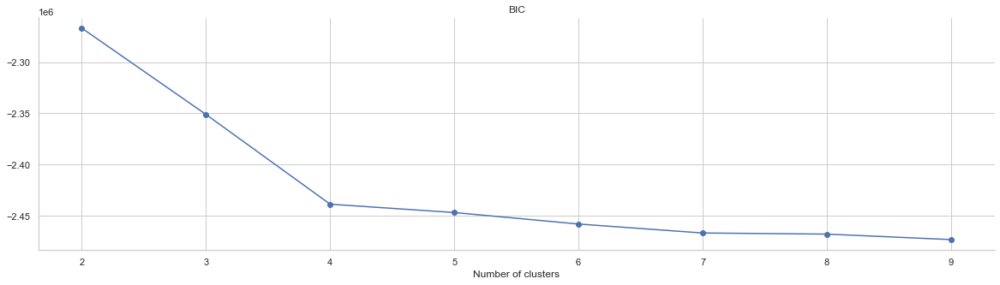

In [10]:
plt.subplots(figsize=(20,5))
plt.plot(bic['k'],bic['bic'],marker='o')
plt.title('BIC')
plt.xlabel('Number of clusters')
sns.despine()
plt.show()

In [11]:
#Con 2 clusters
gmm= GaussianMixture(n_components=2) #datos generados por 2 dist gausseanas

In [12]:
gmm.fit(Xmm) #estima los parametros de las distribuciones

GaussianMixture(n_components=2)

In [15]:
Xp_3=pd.read_csv("PCA_3d.csv",encoding="utf-8")
Xp['gmm_2']=Xp_3["gmm_2"]=df["gmm_2"]= gmm.predict(Xmm)

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



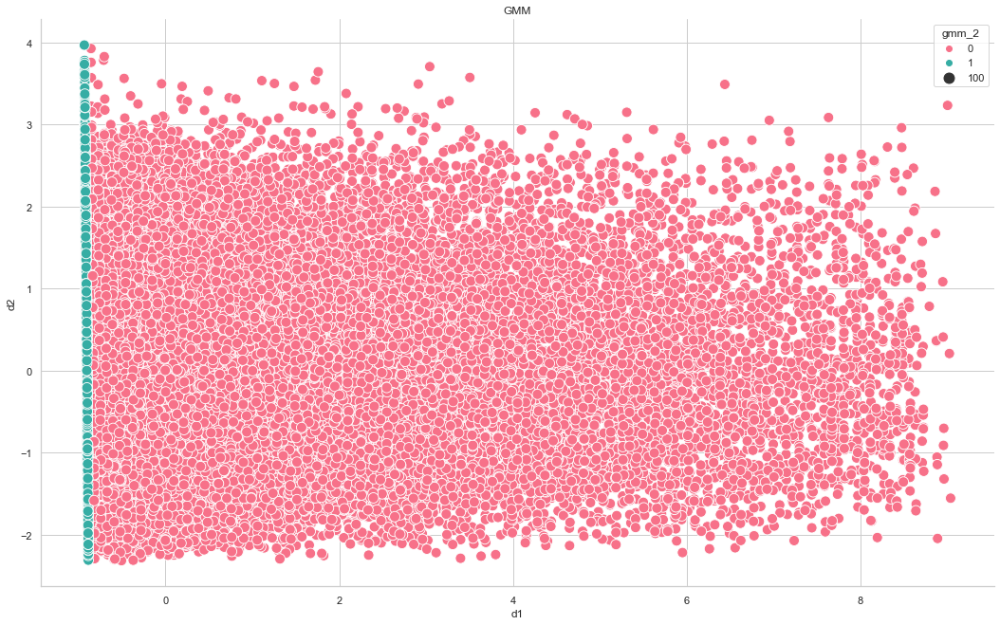

In [16]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["gmm_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [21]:
df["gmm_2"].value_counts(1)

1    0.508677
0    0.491323
Name: gmm_2, dtype: float64

In [22]:
Xp["gmm_2"].value_counts(1)

1    0.508677
0    0.491323
Name: gmm_2, dtype: float64

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gmm_2', ylabel='count'>

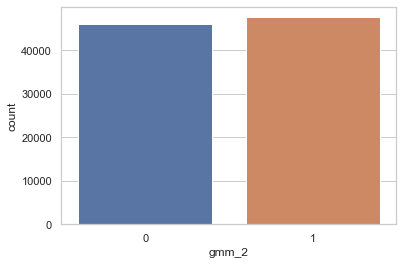

In [24]:
sns.countplot(df["gmm_2"])

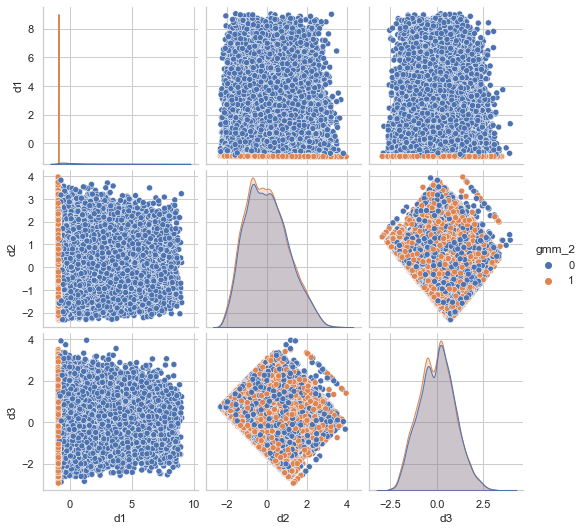

In [26]:
Xp_3["gmm_2"]=Xp_3["gmm_2"].astype(str)
sns.pairplot(data=Xp_3,hue="gmm_2")

In [27]:
Xtmm=pd.read_csv("TSNE.csv",encoding="utf-8")
Xtmm

,Unnamed: 0,x,y
0,49493,92.460770,35.433300
1,67655,-50.859260,55.752890
2,25333,-109.708780,43.756590
3,70585,59.609055,-38.454346
4,53996,-43.915325,-39.624650
...,...,...,...
18700,71383,64.307790,-63.114285
18701,27520,29.104956,-5.070443
18702,52224,-45.222992,32.217705
18703,33887,-59.956078,-16.113598


In [28]:
Xtmm=Xtmm.merge(df["gmm_2"],how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,gmm_2
0,49493,92.460770,35.433300,1
1,67655,-50.859260,55.752890,1
2,25333,-109.708780,43.756590,1
3,70585,59.609055,-38.454346,0
4,53996,-43.915325,-39.624650,0
...,...,...,...,...
18700,71383,64.307790,-63.114285,1
18701,27520,29.104956,-5.070443,0
18702,52224,-45.222992,32.217705,1
18703,33887,-59.956078,-16.113598,1


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



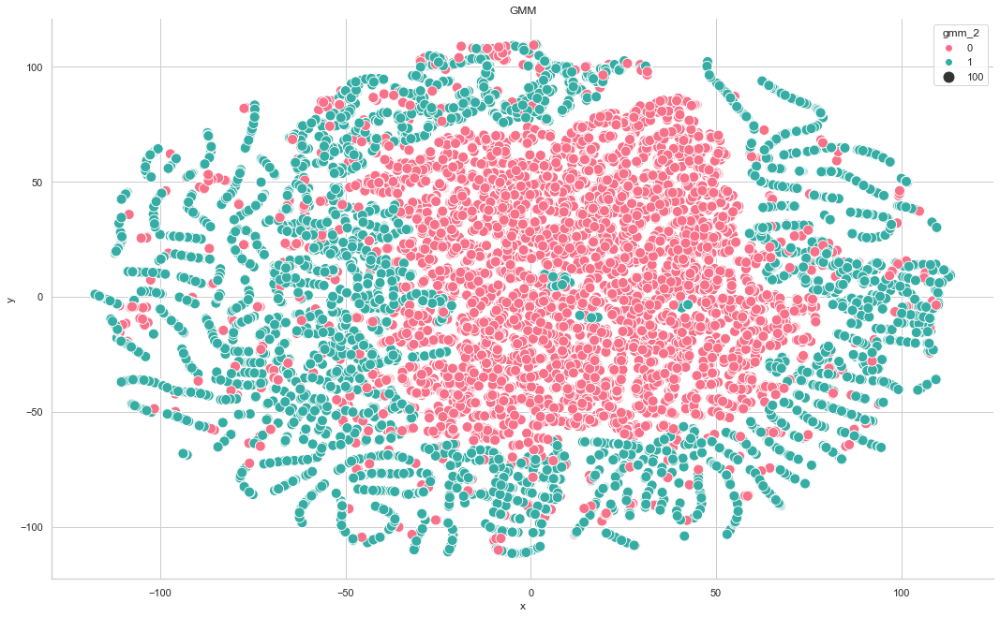

In [30]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["gmm_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [32]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")
pd.to_pickle(gmm,"GMM_2.pkl")

In [33]:
#Con 2 clusters
gmms= GaussianMixture(n_components=2,covariance_type="spherical") #datos generados por 2 dist gausseanas
gmms.fit(Xmm) #estima los parametros de las distribuciones

GaussianMixture(covariance_type='spherical', n_components=2)

In [37]:
Xp['gmms_2']=Xp_3["gmms_2"]=df["gmms_2"]= gmms.predict(Xmm)

In [38]:
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes,K-means_2,K-means_4,gmm_2,gmms_2
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43,0,2,0,1
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7,1,0,0,0
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,0,1,0
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20,1,0,0,0
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3,1,0,0,0
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0,1,3,1,0
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21,1,3,0,0
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0,1,0,1,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



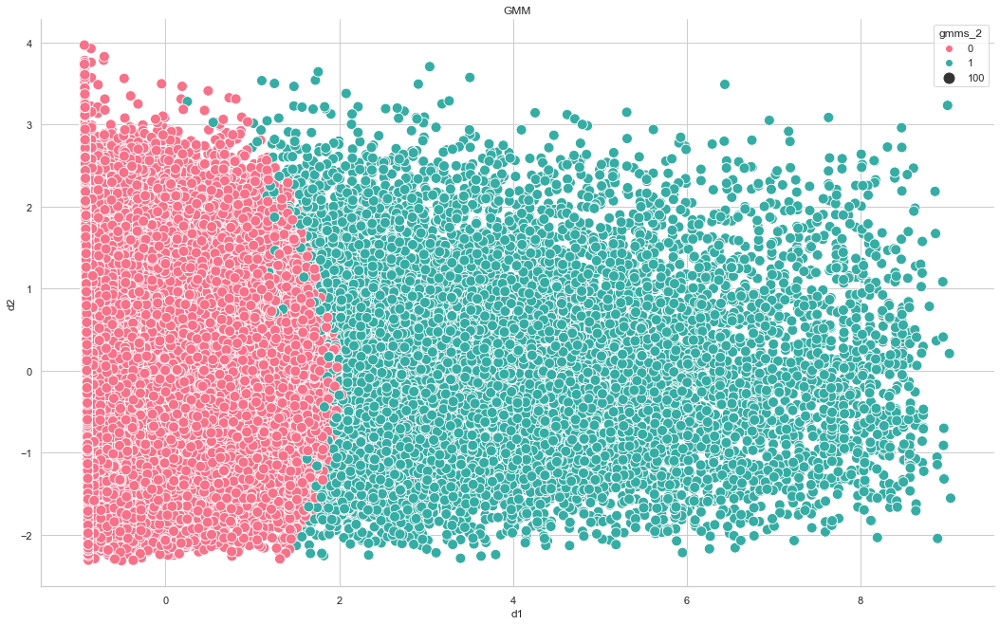

In [39]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["gmms_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [40]:
df["gmms_2"].value_counts(1)

0    0.881863
1    0.118137
Name: gmms_2, dtype: float64

In [41]:
Xp["gmms_2"].value_counts(1)

0    0.881863
1    0.118137
Name: gmms_2, dtype: float64

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gmms_2', ylabel='count'>

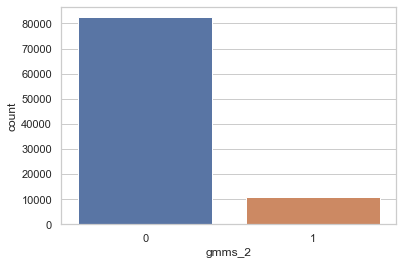

In [42]:
sns.countplot(df["gmms_2"])

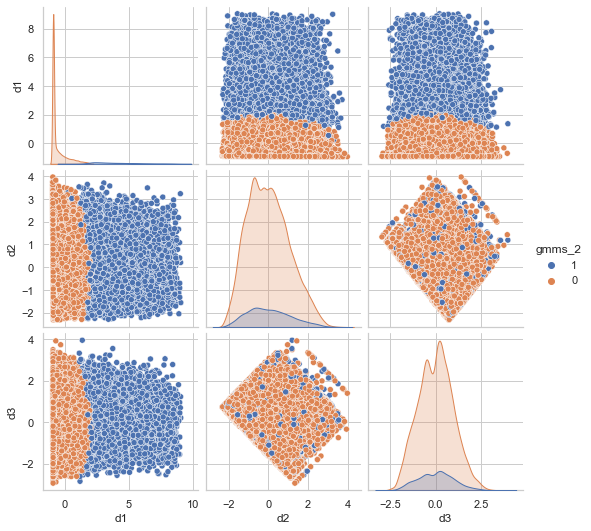

In [43]:
Xp_3["gmms_2"]=Xp_3["gmms_2"].astype(str)
sns.pairplot(data=Xp_3,hue="gmms_2")

In [44]:
Xtmm=Xtmm.merge(df["gmms_2"],how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,gmm_2,gmms_2
0,49493,92.460770,35.433300,1,0
1,67655,-50.859260,55.752890,1,0
2,25333,-109.708780,43.756590,1,0
3,70585,59.609055,-38.454346,0,0
4,53996,-43.915325,-39.624650,0,0
...,...,...,...,...,...
18700,71383,64.307790,-63.114285,1,0
18701,27520,29.104956,-5.070443,0,0
18702,52224,-45.222992,32.217705,1,0
18703,33887,-59.956078,-16.113598,1,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



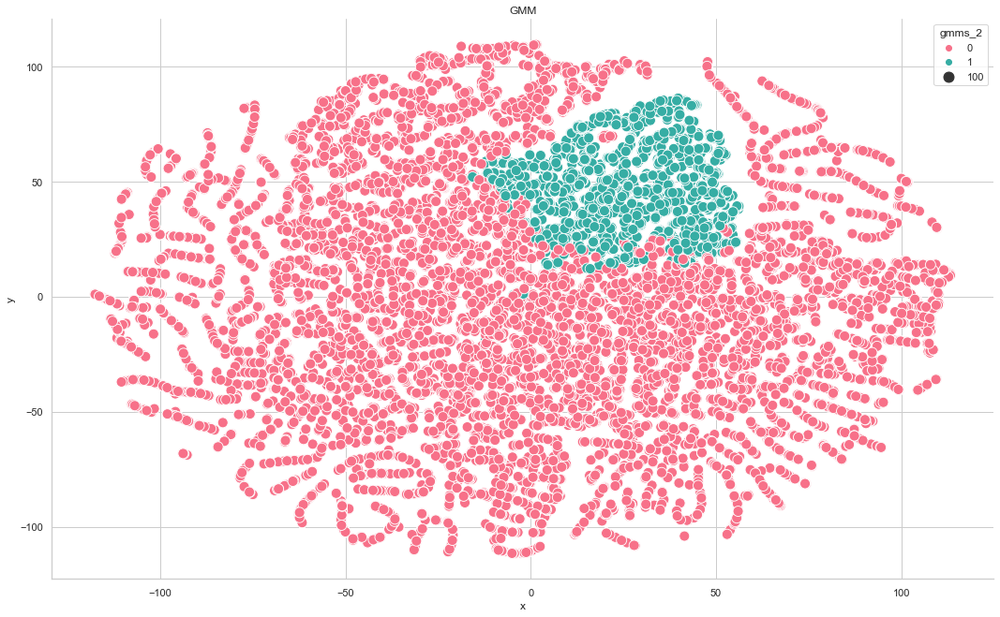

In [45]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["gmms_2"],palette=sns.color_palette("husl", 2),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [46]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")
pd.to_pickle(gmms,"GMMS_2.pkl")

#### Para 3 clusters

In [47]:
#Con 2 clusters
gmm= GaussianMixture(n_components=3) #datos generados por 3 dist gausseanas

In [48]:
gmm.fit(Xmm) #estima los parametros de las distribuciones

GaussianMixture(n_components=3)

In [49]:
Xp['gmm_3']=Xp_3["gmm_3"]=df["gmm_3"]= gmm.predict(Xmm)

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



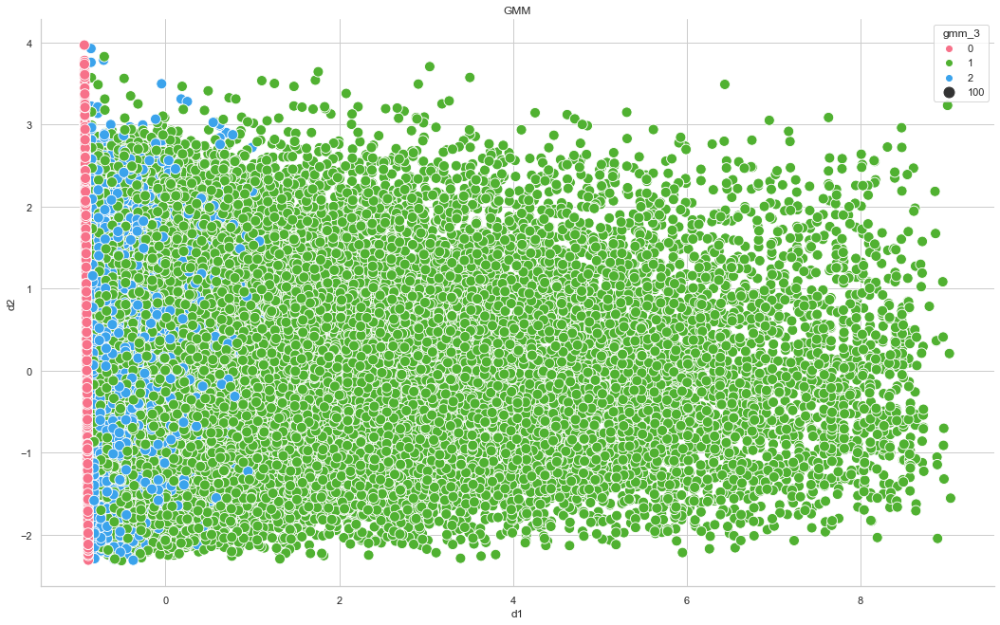

In [50]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["gmm_3"],palette=sns.color_palette("husl", 3),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [51]:
df["gmm_3"].value_counts(1)

0    0.508677
1    0.376533
2    0.114790
Name: gmm_3, dtype: float64

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gmm_3', ylabel='count'>

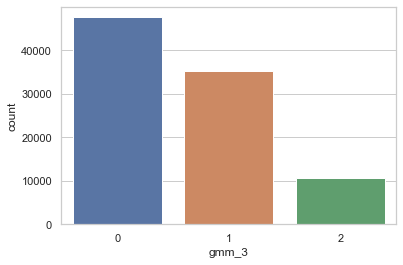

In [52]:
sns.countplot(df["gmm_3"])

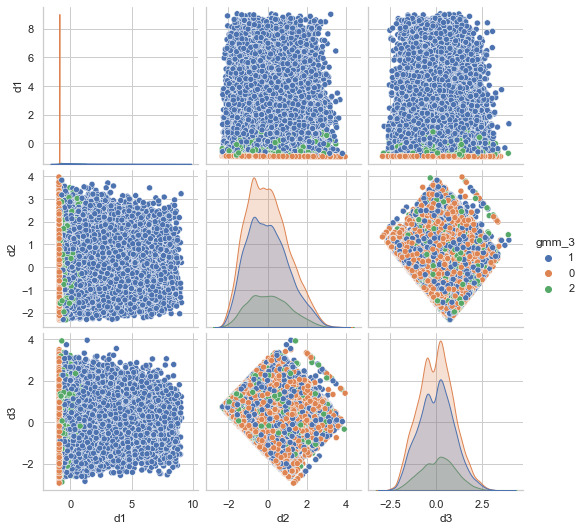

In [53]:
Xp_3["gmm_3"]=Xp_3["gmm_3"].astype(str)
sns.pairplot(data=Xp_3,hue="gmm_3")

In [54]:
Xtmm=Xtmm.merge(df["gmm_3"],how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,gmm_2,gmms_2,gmm_3
0,49493,92.460770,35.433300,1,0,0
1,67655,-50.859260,55.752890,1,0,0
2,25333,-109.708780,43.756590,1,0,0
3,70585,59.609055,-38.454346,0,0,2
4,53996,-43.915325,-39.624650,0,0,2
...,...,...,...,...,...,...
18700,71383,64.307790,-63.114285,1,0,0
18701,27520,29.104956,-5.070443,0,0,1
18702,52224,-45.222992,32.217705,1,0,0
18703,33887,-59.956078,-16.113598,1,0,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



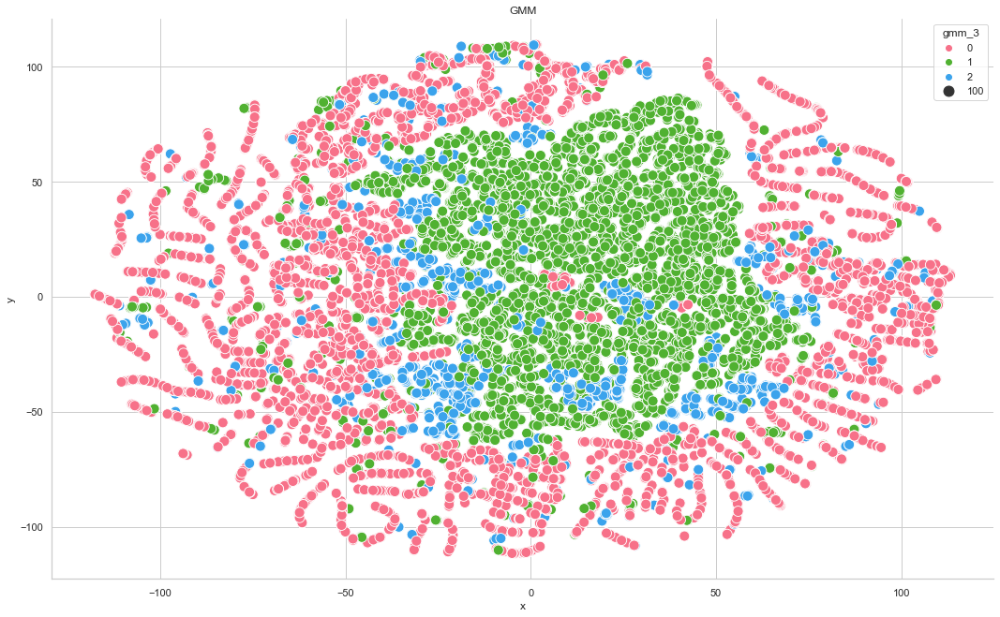

In [56]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["gmm_3"],palette=sns.color_palette("husl", 3),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [57]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")
pd.to_pickle(gmm,"GMM_3.pkl")

In [58]:
#Con 3 clusters
gmms= GaussianMixture(n_components=3,covariance_type="tied") #datos generados por 3 dist gausseanas
gmms.fit(Xmm) #estima los parametros de las distribuciones

GaussianMixture(covariance_type='tied', n_components=3)

In [59]:
Xp['gmms_3']=Xp_3["gmms_3"]=df["gmms_3"]= gmms.predict(Xmm)

In [60]:
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes,K-means_2,K-means_4,gmm_2,gmms_2,gmm_3,gmms_3
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43,0,2,0,1,1,1
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7,1,0,0,0,1,1
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,0,1,0,0,1
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20,1,0,0,0,1,1
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3,1,0,0,0,2,1
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0,1,3,1,0,0,0
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21,1,3,0,0,1,1
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0,1,0,1,0,0,1


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



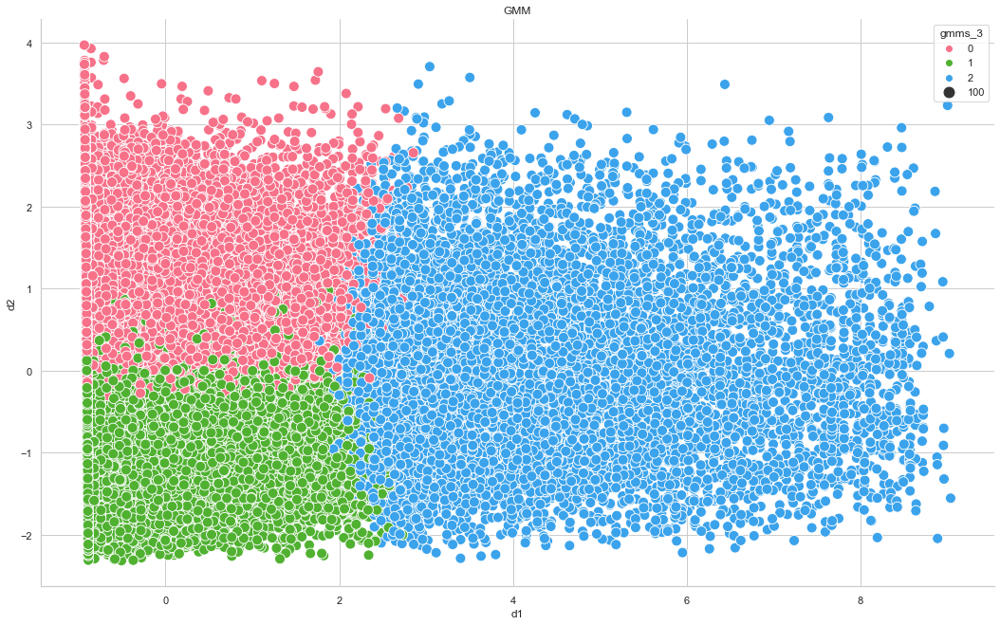

In [61]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xp["d1"], Xp["d2"],hue=Xp["gmms_3"],palette=sns.color_palette("husl", 3),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [62]:
df["gmms_3"].value_counts(1)

1    0.470185
0    0.428967
2    0.100848
Name: gmms_3, dtype: float64

/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='gmms_3', ylabel='count'>

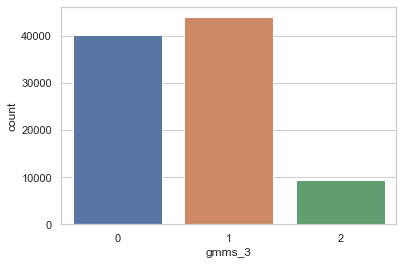

In [63]:
sns.countplot(df["gmms_3"])

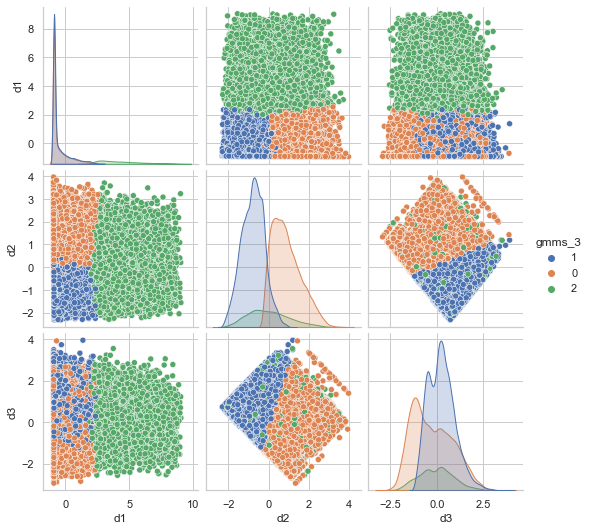

In [64]:
Xp_3["gmms_3"]=Xp_3["gmms_3"].astype(str)
sns.pairplot(data=Xp_3,hue="gmms_3")

In [65]:
Xtmm=Xtmm.merge(df["gmms_3"],how="left",left_on="Unnamed: 0",right_index=True)
Xtmm

,Unnamed: 0,x,y,gmm_2,gmms_2,gmm_3,gmms_3
0,49493,92.460770,35.433300,1,0,0,1
1,67655,-50.859260,55.752890,1,0,0,0
2,25333,-109.708780,43.756590,1,0,0,1
3,70585,59.609055,-38.454346,0,0,2,1
4,53996,-43.915325,-39.624650,0,0,2,0
...,...,...,...,...,...,...,...
18700,71383,64.307790,-63.114285,1,0,0,1
18701,27520,29.104956,-5.070443,0,0,1,1
18702,52224,-45.222992,32.217705,1,0,0,0
18703,33887,-59.956078,-16.113598,1,0,0,0


/Users/jesusarredondo/Documents/Diplomado/Modulo3/mod3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



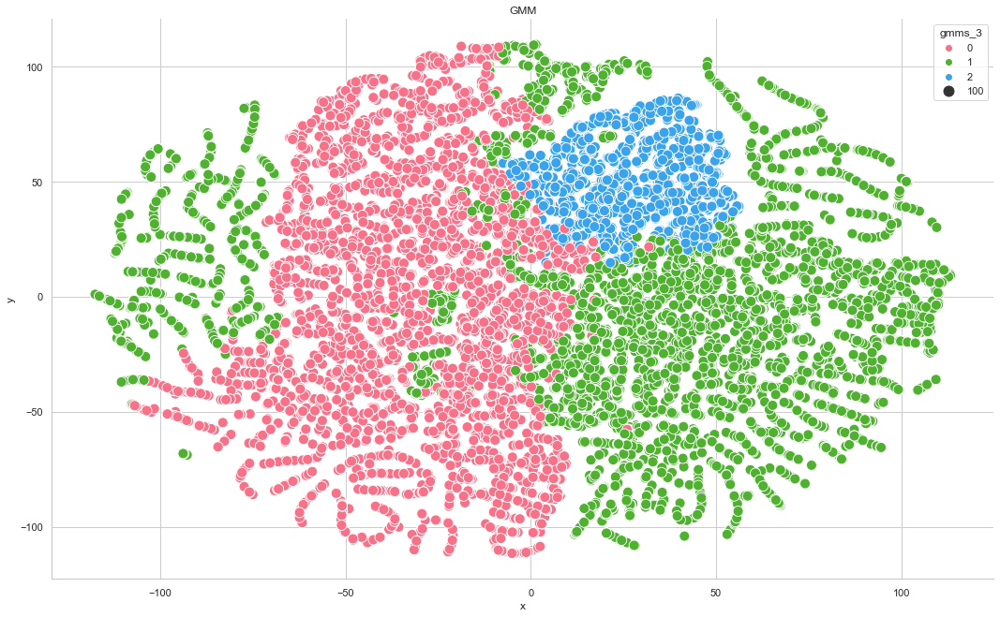

In [66]:
plt.subplots(figsize=(18,11))
sns.scatterplot(Xtmm["x"], Xtmm["y"],hue=Xtmm["gmms_3"],palette=sns.color_palette("husl", 3),size=100,sizes=(120, 120)).set(title="GMM")
sns.despine()
plt.show()

In [67]:
df.to_csv("Data_sinout.csv",index=False,encoding="utf-8")
pd.to_pickle(gmms,"GMM_tied_3.pkl")

En base a todos los modelos visto obtamos por agarrar los modelos:
* K-means de 4 clusters
* GMM de 3 clusters con una covarianza compartida

# Perfilamiento

In [2]:
df= pd.read_csv("Data_sinout.csv",encoding="utf-8")
df

,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,Total Delay in Minutes,K-means_2,K-means_4,gmm_2,gmms_2,gmm_3,gmms_3
0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,43,0,2,0,1,1,1
1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,7,1,0,0,0,1,1
2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,0,1,0,0,1
3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,20,1,0,0,0,1,1
4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0,neutral or dissatisfied,3,1,0,0,0,2,1
93523,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0,satisfied,0,1,3,1,0,0,0
93524,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14,neutral or dissatisfied,21,1,3,0,0,1,1
93525,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0,neutral or dissatisfied,0,1,0,1,0,0,1


In [16]:
sin_importancia = ["id"]
columnas=df.columns[:-6]
vcont = ["Age","Flight Distance","Departure Delay in Minutes","Arrival Delay in Minutes","Total Delay in Minutes"]
vdisc = [c for c in columnas if c not in sin_importancia+vcont]
columnas

Index(['id', 'Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction', 'Total Delay in Minutes'],
      dtype='object')

## K-Means de 4 clusters

In [17]:
kmeans= df[vcont+vdisc+["K-means_4"]].copy()
kmeans

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,Gender,Customer Type,Type of Travel,Class,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,satisfaction,K-means_4
0,13,460,25,18,43,Male,Loyal Customer,Personal Travel,Eco Plus,3,4,3,1,5,3,5,5,4,3,4,4,5,5,neutral or dissatisfied,2
1,25,235,1,6,7,Male,disloyal Customer,Business travel,Business,3,2,3,3,1,3,1,1,1,5,3,1,4,1,neutral or dissatisfied,0
2,26,1142,0,0,0,Female,Loyal Customer,Business travel,Business,2,2,2,2,5,5,5,5,4,3,4,4,4,5,satisfied,0
3,25,562,11,9,20,Female,Loyal Customer,Business travel,Business,2,5,5,5,2,2,2,2,2,5,3,1,4,2,neutral or dissatisfied,0
4,61,214,0,0,0,Male,Loyal Customer,Business travel,Business,3,3,3,3,4,5,5,3,3,4,4,3,3,3,satisfied,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,23,192,3,0,3,Female,disloyal Customer,Business travel,Eco,2,1,2,3,2,2,2,2,3,1,4,2,3,2,neutral or dissatisfied,0
93523,49,2347,0,0,0,Male,Loyal Customer,Business travel,Business,4,4,4,4,2,4,5,5,5,5,5,5,5,4,satisfied,3
93524,30,1995,7,14,21,Male,disloyal Customer,Business travel,Business,1,1,1,3,4,1,5,4,3,2,4,5,5,4,neutral or dissatisfied,3
93525,22,1000,0,0,0,Female,disloyal Customer,Business travel,Eco,1,1,1,5,1,1,1,1,4,5,1,5,4,1,neutral or dissatisfied,0


In [18]:
kmeans[vcont+["K-means_4"]].groupby(by="K-means_4").mean().style.background_gradient(cmap='Blues',axis=0)

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
K-means_4,,,,,
0,25.154167,738.064344,2.577774,2.620721,5.198496
1,51.976569,692.603484,2.493859,2.530379,5.024239
2,39.268635,1101.604206,35.142660,32.731859,67.874519
3,43.399074,2739.412303,2.930939,2.766108,5.697047


In [22]:
vdisc[:4]

['Gender', 'Customer Type', 'Type of Travel', 'Class']

In [20]:
vdisc[4:-2]

['Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service']

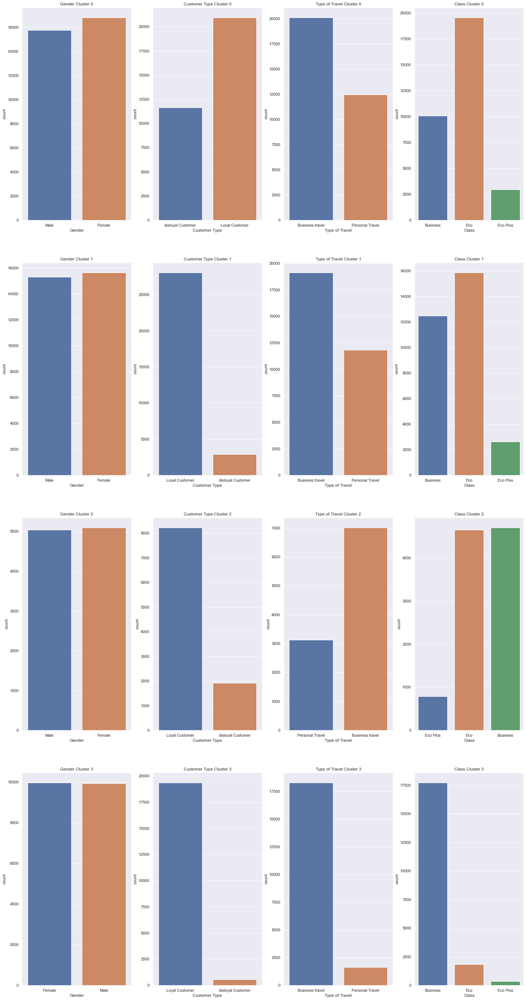

In [25]:
sns.set()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(4, 4,figsize=(25, 50))


for i in range(4):
    for v in range(len(vdisc[:4])):
        sns.countplot(data=df[vdisc[:4]+["K-means_4"]].loc[df["K-means_4"]==i], x=vdisc[v],ax=axes[i,v]).set(title=vdisc[v]+ " Cluster "+str(i))
        
        
        

In [36]:
df[[vdisc[0]]+["id","K-means_4"]].pivot_table(index="K-means_4",\
                                columns=vdisc[0],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Gender,Female,Male
K-means_4,,
0,16801,15774
1,15632,15310
2,5090,5039
3,9954,9927


In [29]:
vdisc[:4]

['Gender', 'Customer Type', 'Type of Travel', 'Class']

In [37]:
df[[vdisc[1]]+["id","K-means_4"]].pivot_table(index="K-means_4",\
                                columns=vdisc[1],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Customer Type,Loyal Customer,disloyal Customer
K-means_4,,
0,20929,11646
1,28040,2902
2,8214,1915
3,19331,550


In [38]:
df[[vdisc[2]]+["id","K-means_4"]].pivot_table(index="K-means_4",\
                                columns=vdisc[2],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Type of Travel,Business travel,Personal Travel
K-means_4,,
0,20109,12466
1,19107,11835
2,7001,3128
3,18260,1621


In [39]:
df[[vdisc[3]]+["id","K-means_4"]].pivot_table(index="K-means_4",\
                                columns=vdisc[3],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Class,Business,Eco,Eco Plus
K-means_4,,,
0,10087,19546,2942
1,12480,15846,2616
2,4697,4648,784
3,17695,1842,344


In [45]:
aux=df[vdisc[4:-1]+["K-means_4"]].groupby(by="K-means_4").agg(pd.Series.mode)
aux.style.background_gradient(cmap="Blues",axis=1)

,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness
K-means_4,,,,,,,,,,,,,,
0,2,4,3,3,4,3,4,4,4,4,4,4,4,4
1,2,4,3,3,4,4,4,4,4,4,4,4,4,4
2,3,4,3,3,3,4,4,4,4,4,4,3,4,4
3,2,4,3,3,4,4,4,4,4,4,4,4,4,4


In [46]:
import plotly.graph_objects as go
fig = go.Figure()
#radar
for i,row in aux.iterrows():
    fig.add_trace(go.Scatterpolar(r=row.values,
                                  theta=vdisc[4:-1],
                                  fill='toself',
                                  name=f'cluster {i}'))
fig.show()

In [75]:
df[[vdisc[-1]]+["K-means_4"]].groupby(by="K-means_4").agg(pd.Series.mode)

,satisfaction
K-means_4,
0,neutral or dissatisfied
1,neutral or dissatisfied
2,neutral or dissatisfied
3,satisfied


In [48]:
Xmm=pd.read_csv("Base_estandarizada.csv",encoding="utf-8")
Xmm=Xmm[Xmm.columns[1:]]
Xmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
0,0.076923,0.086632,0.357143,0.257143,0.325758
1,0.230769,0.041195,0.014286,0.085714,0.053030
2,0.243590,0.224354,0.000000,0.000000,0.000000
3,0.230769,0.107229,0.157143,0.128571,0.151515
4,0.692308,0.036955,0.000000,0.000000,0.000000
...,...,...,...,...,...
93522,0.205128,0.032512,0.042857,0.000000,0.022727
93523,0.538462,0.467690,0.000000,0.000000,0.000000
93524,0.294872,0.396607,0.100000,0.200000,0.159091
93525,0.192308,0.195679,0.000000,0.000000,0.000000


In [50]:
from sklearn.tree import DecisionTreeClassifier 
escalada= Xmm
tree = DecisionTreeClassifier()
tree.fit(escalada,df['K-means_4'])
importances=tree.feature_importances_
feature_importance= sorted(zip(importances, list(escalada.columns)), reverse=True)
data_tree = pd.DataFrame(feature_importance, columns=['importance', 'feature'])
importance= list(data_tree['importance'])
feature= list(data_tree['feature'])

In [51]:
data_tree

,importance,feature
0,0.374630,Age
1,0.368773,Flight Distance
2,0.255077,Total Delay in Minutes
3,0.000860,Departure Delay in Minutes
4,0.000660,Arrival Delay in Minutes


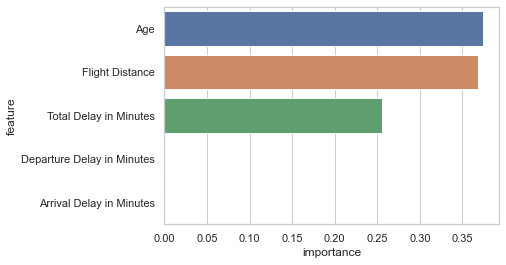

In [54]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(y="feature", x="importance", data=data_tree,orient="h")

In [56]:
from scipy.stats import kruskal
aux = df[['K-means_4']+list(data_tree['feature'])].groupby(['K-means_4']).mean()
ls_res = []
for feature in aux.columns:
    l = []
    for cl in df["K-means_4"].unique():
        l.append(df.loc[df["K-means_4"]==cl, feature].to_list())
    kr = kruskal(*l)
    ls_res.append((feature,kr.pvalue))

In [57]:
data_kruskal=pd.DataFrame(ls_res,columns=['Feature','p_value']).round(3)
data_kruskal

,Feature,p_value
0,Age,0.0
1,Flight Distance,0.0
2,Total Delay in Minutes,0.0
3,Departure Delay in Minutes,0.0
4,Arrival Delay in Minutes,0.0


## Mezcla Gausseanas de 3 cluster con covarianza compartida

In [58]:
gmm= df[vcont+vdisc+["gmms_3"]].copy()
gmm

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes,Gender,Customer Type,Type of Travel,Class,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,satisfaction,gmms_3
0,13,460,25,18,43,Male,Loyal Customer,Personal Travel,Eco Plus,3,4,3,1,5,3,5,5,4,3,4,4,5,5,neutral or dissatisfied,1
1,25,235,1,6,7,Male,disloyal Customer,Business travel,Business,3,2,3,3,1,3,1,1,1,5,3,1,4,1,neutral or dissatisfied,1
2,26,1142,0,0,0,Female,Loyal Customer,Business travel,Business,2,2,2,2,5,5,5,5,4,3,4,4,4,5,satisfied,1
3,25,562,11,9,20,Female,Loyal Customer,Business travel,Business,2,5,5,5,2,2,2,2,2,5,3,1,4,2,neutral or dissatisfied,1
4,61,214,0,0,0,Male,Loyal Customer,Business travel,Business,3,3,3,3,4,5,5,3,3,4,4,3,3,3,satisfied,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93522,23,192,3,0,3,Female,disloyal Customer,Business travel,Eco,2,1,2,3,2,2,2,2,3,1,4,2,3,2,neutral or dissatisfied,1
93523,49,2347,0,0,0,Male,Loyal Customer,Business travel,Business,4,4,4,4,2,4,5,5,5,5,5,5,5,4,satisfied,0
93524,30,1995,7,14,21,Male,disloyal Customer,Business travel,Business,1,1,1,3,4,1,5,4,3,2,4,5,5,4,neutral or dissatisfied,1
93525,22,1000,0,0,0,Female,disloyal Customer,Business travel,Eco,1,1,1,5,1,1,1,1,4,5,1,5,4,1,neutral or dissatisfied,1


In [59]:
gmm[vcont+["gmms_3"]].groupby(by="gmms_3").mean().style.background_gradient(cmap='Blues',axis=0)

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Total Delay in Minutes
gmms_3,,,,,
0,51.529138,1628.166650,2.801570,2.735718,5.537288
1,28.391814,797.390131,2.709585,2.827538,5.537123
2,39.476887,1135.083863,36.451760,33.513677,69.965437


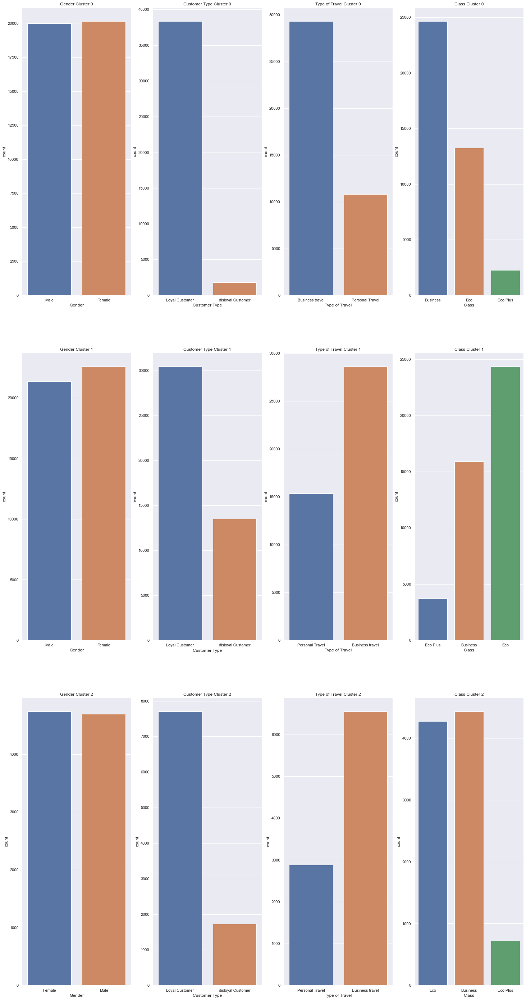

In [61]:
sns.set()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(3, 4,figsize=(25, 50))


for i in range(3):
    for v in range(len(vdisc[:4])):
        sns.countplot(data=df[vdisc[:4]+["gmms_3"]].loc[df["gmms_3"]==i], x=vdisc[v],ax=axes[i,v]).set(title=vdisc[v]+ " Cluster "+str(i))

In [62]:
df[[vdisc[0]]+["id","gmms_3"]].pivot_table(index="gmms_3",\
                                columns=vdisc[0],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Gender,Female,Male
gmms_3,,
0,20138,19982
1,22600,21375
2,4739,4693


In [63]:
df[[vdisc[1]]+["id","gmms_3"]].pivot_table(index="gmms_3",\
                                columns=vdisc[1],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Customer Type,Loyal Customer,disloyal Customer
gmms_3,,
0,38347,1773
1,30464,13511
2,7703,1729


In [64]:
df[[vdisc[2]]+["id","gmms_3"]].pivot_table(index="gmms_3",\
                                columns=vdisc[2],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Type of Travel,Business travel,Personal Travel
gmms_3,,
0,29304,10816
1,28623,15352
2,6550,2882


In [65]:
df[[vdisc[3]]+["id","gmms_3"]].pivot_table(index="gmms_3",\
                                columns=vdisc[3],aggfunc="count",fill_value=0,values="id").style.background_gradient(cmap='Blues',axis=0)

Class,Business,Eco,Eco Plus
gmms_3,,,
0,24634,13241,2245
1,15892,24364,3719
2,4433,4277,722


In [67]:
aux=df[vdisc[4:-1]+["gmms_3"]].groupby(by="gmms_3").agg(pd.Series.mode)
aux.style.background_gradient(cmap="Blues",axis=1)

,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness
gmms_3,,,,,,,,,,,,,,
0,2,4,3,3,4,4,4,4,4,4,4,4,4,4
1,2,4,3,3,4,4,4,4,4,4,4,4,4,4
2,3,4,3,3,3,4,4,4,4,4,4,4,4,4


In [68]:
import plotly.graph_objects as go
fig = go.Figure()
#radar
for i,row in aux.iterrows():
    fig.add_trace(go.Scatterpolar(r=row.values,
                                  theta=vdisc[4:-1],
                                  fill='toself',
                                  name=f'cluster {i}'))
fig.show()

In [76]:
df[[vdisc[-1]]+["gmms_3"]].groupby(by="gmms_3").agg(pd.Series.mode)

,satisfaction
gmms_3,
0,satisfied
1,neutral or dissatisfied
2,neutral or dissatisfied


In [69]:
 escalada= Xmm
tree = DecisionTreeClassifier()
tree.fit(escalada,df['gmms_3'])
importances=tree.feature_importances_
feature_importance= sorted(zip(importances, list(escalada.columns)), reverse=True)
data_tree = pd.DataFrame(feature_importance, columns=['importance', 'feature'])
importance= list(data_tree['importance'])
feature= list(data_tree['feature'])

In [70]:
data_tree

,importance,feature
0,0.520995,Age
1,0.265378,Total Delay in Minutes
2,0.204501,Flight Distance
3,0.007250,Departure Delay in Minutes
4,0.001876,Arrival Delay in Minutes


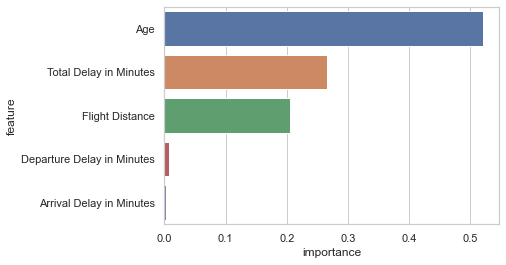

In [71]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(y="feature", x="importance", data=data_tree,orient="h")

In [72]:
aux = df[['gmms_3']+list(data_tree['feature'])].groupby(['gmms_3']).mean()
ls_res = []
for feature in aux.columns:
    l = []
    for cl in df["gmms_3"].unique():
        l.append(df.loc[df["gmms_3"]==cl, feature].to_list())
    kr = kruskal(*l)
    ls_res.append((feature,kr.pvalue))

In [73]:
data_kruskal=pd.DataFrame(ls_res,columns=['Feature','p_value']).round(3)
data_kruskal

,Feature,p_value
0,Age,0.0
1,Total Delay in Minutes,0.0
2,Flight Distance,0.0
3,Departure Delay in Minutes,0.0
4,Arrival Delay in Minutes,0.0
